In [4]:
import numpy as np
import anndata as ad
import scanpy as sc
import pandas as pd
import decoupler as dc
import os
import pickle as pkl
import pydeseq2
from scipy import sparse
from scipy.stats import gaussian_kde
from statsmodels.stats.multitest import multipletests
import seaborn as sns, matplotlib.pyplot as plt
import gseapy as gp
from gseapy import dotplot
from gseapy import gseaplot
from scipy.stats import spearmanr
from scipy.stats import hypergeom

from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
import warnings

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import StrVector, FloatVector
from IPython.display import Image

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# Load in data

adata = sc.read("/rds/general/user/ztb25/home/PBMC_datasets/concatenated_adata.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 349497 × 15457
    obs: 'gsm_id', 'diagnosis', 'age', 'gender', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'dataset', 'sample_combined'
    var: 'gene_ids', 'feature_types', 'mt', 'gene_symbols', 'genome', 'gene_versions'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_norm'

In [7]:
# Bringing back diagnosis column, needed for composition analysis, that got dropped at concatenation.

# the per-dataset files 
files = {
    "1": "/rds/general/user/ztb25/home/PBMC_datasets/1/PBMC1_clustering.h5ad",
    "4": "/rds/general/user/ztb25/home/PBMC_datasets/4/PBMC4_clustering.h5ad",
    "5": "/rds/general/user/ztb25/home/PBMC_datasets/5/PBMC5_clustering.h5ad",
    "6": "/rds/general/user/ztb25/home/PBMC_datasets/6/PBMC6_clustering.h5ad",
}

diag_map = {}
for ds, path in files.items():
    a = ad.read_h5ad(path, backed="r")
    integrated_barcodes = a.obs_names + f"-{ds}"
    if "diagnosis" in a.obs.columns:
        diags = a.obs["diagnosis"].astype(str).tolist()
    else:
        diags = ["CTRL"] * a.n_obs          # dataset 6 — no column, all controls
    diag_map.update(dict(zip(integrated_barcodes, diags)))
    a.file.close()

adata.obs["diagnosis"] = adata.obs_names.map(diag_map)

In [8]:
# standardise gender col

gender_map = {
    "M": "male", "F": "female",
    "Male": "male", "Female": "female",
    "male": "male", "female": "female",
}
adata.obs["gender"] = adata.obs["gender"].map(gender_map)

# make sure age is continous
adata.obs["age"] = pd.to_numeric(adata.obs["age"])


In [9]:
# set layer to raw counts

adata.X = adata.layers["counts"]

In [10]:
# Pseudobulk data (using decoupler)

pdata = dc.pp.pseudobulk(
    adata=adata,
    sample_col="sample_combined",
    groups_col="celltypist_cell_label_fine",
    mode="sum", 
)


In [11]:
pdata

AnnData object with n_obs × n_vars = 1120 × 15457
    obs: 'sample_combined', 'celltypist_cell_label_fine', 'gsm_id', 'diagnosis', 'age', 'gender', 'sample', 'outlier', 'mt_outlier', 'predicted_doublet', 'dataset', 'psbulk_cells', 'psbulk_counts'
    var: 'gene_ids', 'feature_types', 'mt', 'gene_symbols', 'genome', 'gene_versions'
    layers: 'psbulk_props'

In [12]:
# exclude samples with low cell count (<30)
dc.pp.filter_samples(pdata, min_cells=30)

In [13]:
# Store raw counts in layers
pdata.layers["counts"] = pdata.X.copy()

# Normalize, scale and compute pca
sc.pp.normalize_total(pdata, target_sum=1e4)
sc.pp.log1p(pdata)
sc.pp.scale(pdata, max_value=10)
sc.tl.pca(pdata)

# Return raw counts to X
dc.pp.swap_layer(adata=pdata, key="counts", inplace=True)

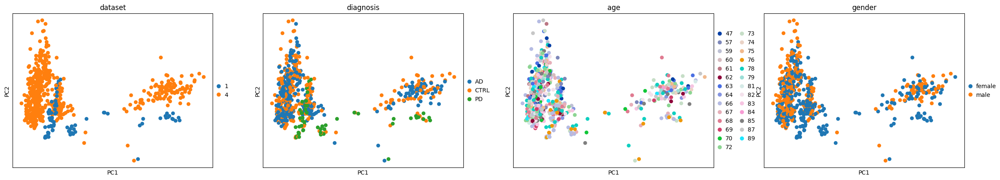

In [14]:
sc.pl.pca(pdata, color = ["dataset", "diagnosis", "age", "gender"])


In [15]:
# make age a continous variable in pdata
pdata.obs["age"] = pd.to_numeric(pdata.obs["age"])

# compute associations or correlations between each inferred PC and the variables in the metadata can be tested
dc.tl.rankby_obsm(pdata, key="X_pca", obs_keys = ["dataset", "diagnosis", "age", "gender"])

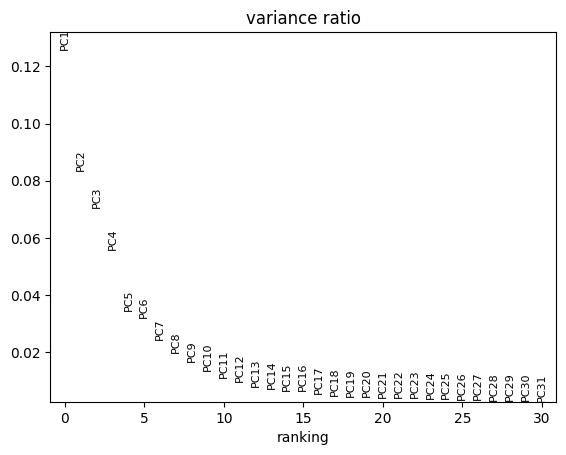

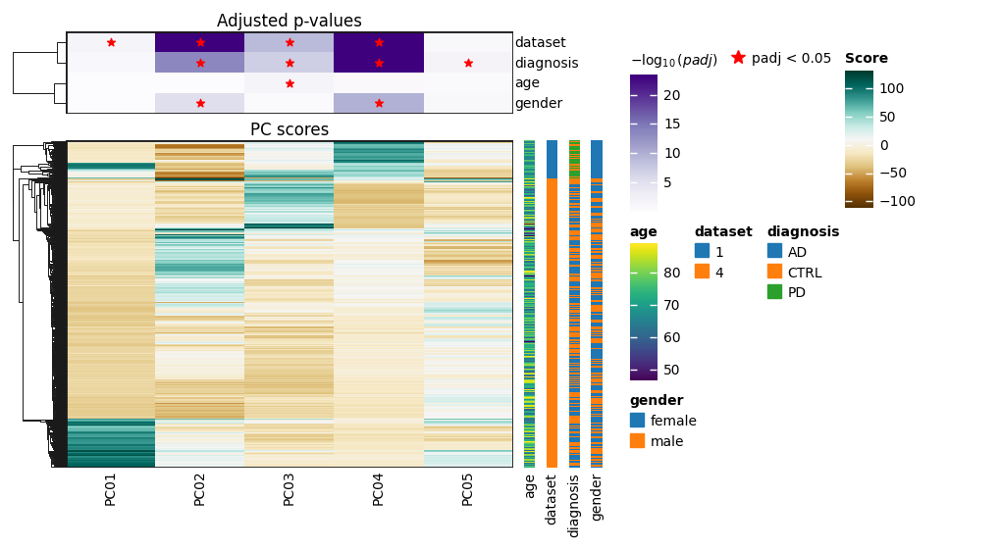

In [16]:
# visualise the importance of each principal component (based on its explained variance ratio) and its associations with metadata variables 
sc.pl.pca_variance_ratio(pdata)
dc.pl.obsm(adata=pdata, return_fig=True, nvar=5, titles=["PC scores", "Adjusted p-values"], figsize=(10, 5))

In [17]:
# Choose a cell type to compare

cell_type = "Classical monocytes"

mask = pdata.obs["celltypist_cell_label_fine"] == cell_type
pdata_ct = pdata[mask].copy()

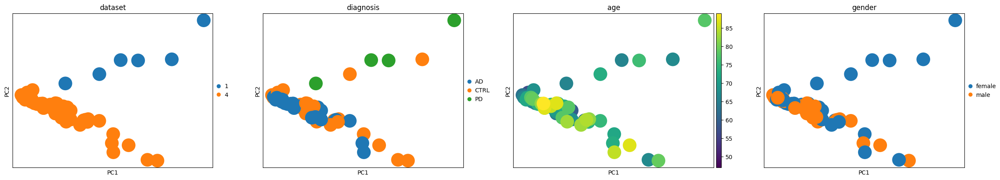

In [18]:
# cell-type specific PCA
sc.tl.pca(pdata_ct)
sc.pl.pca(pdata_ct, color = ["dataset", "diagnosis", "age", "gender"])

In [19]:
# split pdata into PD contrast and AD contrast

pdata_pd = pdata_ct[pdata_ct.obs["diagnosis"].isin(["CTRL", "PD"])].copy()
pdata_ad = pdata_ct[pdata_ct.obs["diagnosis"].isin(["CTRL", "AD"])].copy()

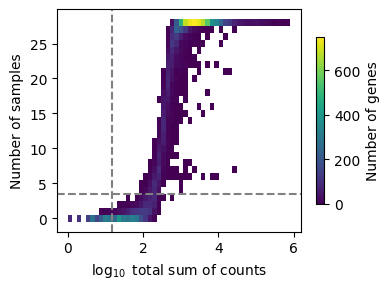

In [20]:
# filtering out genes with low expression

# for PD 
pdata_before_pd = pdata_pd.copy() # save a copy of the pdata before filtering, for later comparison

dc.pl.filter_by_expr(
    pdata_pd,
    group="diagnosis",      
)

dc.pp.filter_by_expr(
    pdata_pd,
    group="diagnosis",      # smallest group sets the min-samples rule)
)

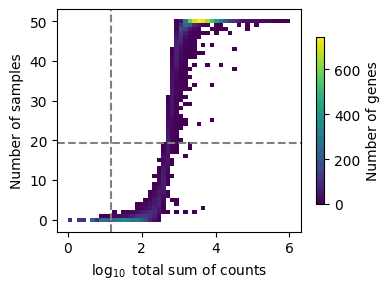

In [21]:
# for AD

pdata_before_ad = pdata_ad.copy() # save a copy of the pdata before filtering, for later comparison

dc.pl.filter_by_expr(
    pdata_ad,
    group="diagnosis",      
)

dc.pp.filter_by_expr(
    pdata_ad,
    group="diagnosis",      # smallest group sets the min-samples rule)
)



In [22]:
# create alternate visualization of gene expression distribution (log-CPM) and the filtering cutoff
def lcpm_from_adata(adata):
    X = adata.X.toarray() if sparse.issparse(adata.X) else np.asarray(adata.X)
    lib = X.sum(axis=1, keepdims=True)        # per-sample library size
    cpm = X / lib * 1e6
    return np.log2(cpm + 0.5)                  # samples x genes, log-CPM

def plot_density(lcpm, cutoff, title, ax):
    for i in range(lcpm.shape[0]):             # one curve per sample
        v = lcpm[i][np.isfinite(lcpm[i])]
        kde = gaussian_kde(v)
        xs = np.linspace(v.min(), v.max(), 200)
        ax.plot(xs, kde(xs), lw=1, alpha=0.7)
    ax.axvline(cutoff, ls=":", color="black")
    ax.set_title(title); ax.set_xlabel("log-CPM"); ax.set_ylabel("density")


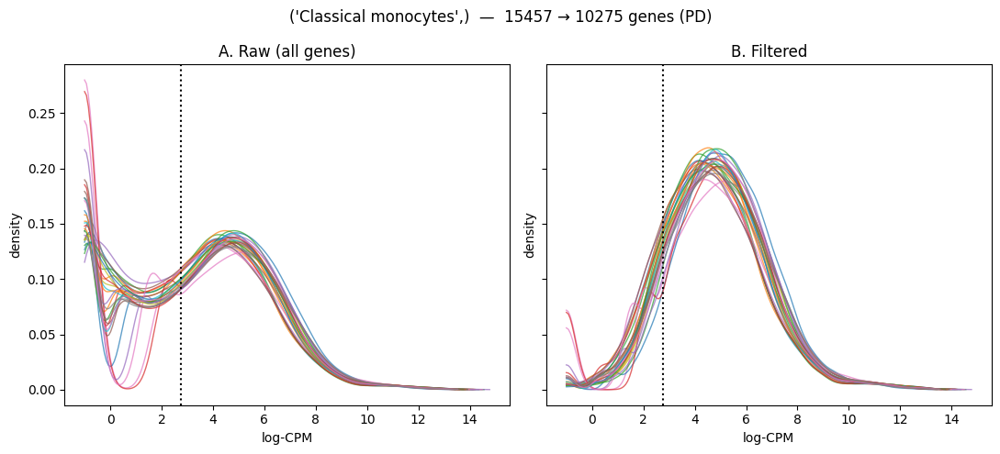

In [23]:
# cutoff line (limma vignette: log2(10/M + 2/L)) from the pre-filter libraries
lib = (pdata_before_pd.X.toarray() if sparse.issparse(pdata_before_pd.X) else np.asarray(pdata_before_pd.X)).sum(axis=1)
cutoff = np.log2(10 / (np.median(lib)*1e-6) + 2 / (lib.mean()*1e-6))

# plot
fig, axes = plt.subplots(1, 2, figsize=(11, 5), sharey=True)
plot_density(lcpm_from_adata(pdata_before_pd), cutoff, "A. Raw (all genes)", axes[0])
plot_density(lcpm_from_adata(pdata_pd),  cutoff, "B. Filtered",        axes[1])
plt.suptitle(f"{pdata_before_pd.obs['celltypist_cell_label_fine'].iloc[0], }  —  {pdata_before_pd.n_vars} → {pdata_pd.n_vars} genes (PD)")
plt.tight_layout()
plt.show()

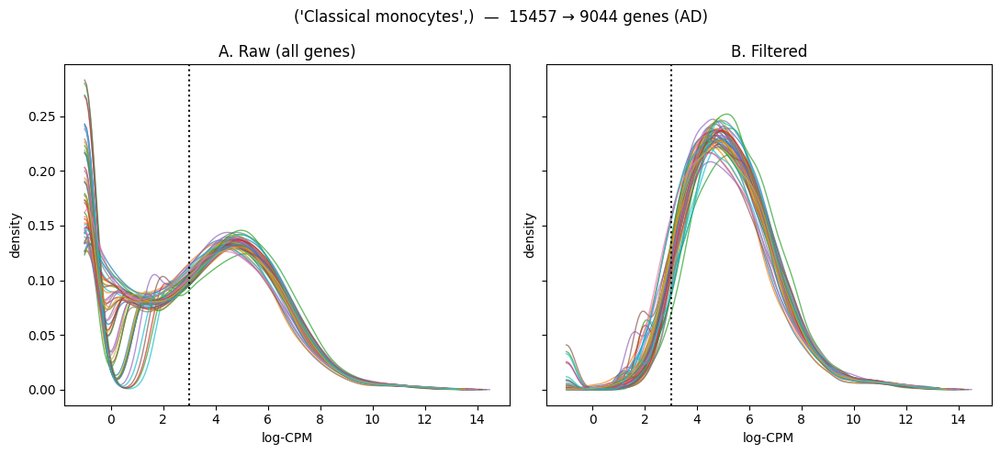

In [24]:
# same plot for AD
lib = (pdata_before_ad.X.toarray() if sparse.issparse(pdata_before_ad.X) else np.asarray(pdata_before_ad.X)).sum(axis=1)
cutoff = np.log2(10 / (np.median(lib)*1e-6) + 2 / (lib.mean()*1e-6))

# plot
fig, axes = plt.subplots(1, 2, figsize=(11, 5), sharey=True)
plot_density(lcpm_from_adata(pdata_before_ad), cutoff, "A. Raw (all genes)", axes[0])
plot_density(lcpm_from_adata(pdata_ad),  cutoff, "B. Filtered",        axes[1])
plt.suptitle(f"{pdata_before_ad.obs['celltypist_cell_label_fine'].iloc[0], }  —  {pdata_before_ad.n_vars} → {pdata_ad.n_vars} genes (AD)")
plt.tight_layout()
plt.show()

In [25]:
#### pyDESEQ2 ######

# extract required dataframes from anndata

# PD 
counts_df = pd.DataFrame(
    pdata_pd.X,  
    columns=pdata_pd.var_names,
    index=pdata_pd.obs["sample_combined"],
)
metadata = pdata_pd.obs[["dataset", "diagnosis", "age", "gender"]].copy()
metadata.index = counts_df.index  
metadata["diagnosis"] = pd.Categorical(
    metadata["diagnosis"],
    categories=["CTRL", "PD"],  # CTRL first = reference
)

metadata.head()

,dataset,diagnosis,age,gender
sample_combined,,,,
1_1,1,CTRL,67,female
1_2,1,CTRL,73,female
1_3,1,PD,66,female
1_4,1,PD,66,female
1_5,1,PD,78,female


In [26]:
# AD
counts_df_ad = pd.DataFrame(
    pdata_ad.X,  
    columns=pdata_ad.var_names,
    index=pdata_ad.obs["sample_combined"],
)
metadata_ad = pdata_ad.obs[["dataset", "diagnosis", "age", "gender"]].copy()
metadata_ad.index = counts_df_ad.index  
metadata_ad["diagnosis"] = pd.Categorical(
    metadata_ad["diagnosis"],
    categories=["CTRL", "AD"],  # CTRL first = reference
)

metadata_ad.head()

,dataset,diagnosis,age,gender
sample_combined,,,,
1_1,1,CTRL,67,female
1_2,1,CTRL,73,female
4_1,4,CTRL,66,male
4_10,4,AD,74,female
4_11,4,AD,66,male


In [27]:
# create DESeqDataSet objects

inference = DefaultInference(n_cpus=8)

# Model 1 -- main: PD vs CTRL, all datasets, AD samples dropped
dds = DeseqDataSet(
    counts=counts_df,
    metadata=metadata,
    design="~diagnosis + dataset + age + gender",
    refit_cooks=True,
    inference=inference,
)

# Model 2 -- secondary: AD vs CTRL, all datasets CTRL, AD samples only,
dds_ad = DeseqDataSet(
    counts=counts_df_ad,
    metadata=metadata_ad,
    design="~diagnosis + dataset + age + gender",
    refit_cooks=True,
    inference=inference,
)


In [28]:
# run the DE analysis (fit the model, compute LFCs)

dds.deseq2()
dds_ad.deseq2()

print(dds)
print(dds_ad)


Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.33 seconds.

Fitting dispersion trend curve...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 1.52 seconds.

Fitting LFCs...
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)


AnnData object with n_obs × n_vars = 28 × 10275
    obs: 'dataset', 'diagnosis', 'age', 'gender', 'size_factors', 'replaceable'
    var: '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_coeffs', 'disp_function_type', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', '_mu_LFC', '_hat_diagonals'
    varm: 'LFC'
    layers: 'normed_counts', '_mu_hat', 'cooks'
AnnData object with n_obs × n_vars = 50 × 9044
    obs: 'dataset', 'diagnosis', 'age', 'gender', 'size_factors', 'replaceable'
    var: '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_c

... done in 0.98 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.



In [29]:
# Extract results for each contrast

# PD vs CTRL contrast
ds1 = DeseqStats(dds, contrast=["diagnosis", "PD", "CTRL"], inference=inference)

# AD vs CTRL contrast
ds2 = DeseqStats(dds_ad, contrast=["diagnosis", "AD", "CTRL"], inference=inference)


In [30]:
# runs Wald test + multiple testing correction

ds1.summary()

ds2.summary()

Running Wald tests...
... done in 0.42 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
LINC01409     6.935429        0.040909  0.567976  0.072026  0.942581  0.99995
LINC01128    10.198761       -0.310832  0.606247 -0.512715  0.608151  0.99995
LINC00115    55.292445        0.087882  0.641589  0.136976  0.891050  0.99995
NOC2L        46.724495       -0.154256  0.232633 -0.663089  0.507273  0.99995
HES4         14.921562       -0.396800  1.412414 -0.280937  0.778758  0.99995
...                ...             ...       ...       ...       ...      ...
MT-ND4L     900.398866       -0.359528  0.487256 -0.737862  0.460598  0.99995
MT-ND4     3718.865062       -0.248014  0.382116 -0.649054  0.516303  0.99995
MT-ND5     1373.599827        0.079234  0.464865  0.170446  0.864660  0.99995
MT-ND6      306.555965       -0.845791  0.535051 -1.580766  0.113932  0.99995
MT-CYB     3270.244751       -0.419611  0.398513 -1.052943  0.292367  0.99995

[102

... done in 0.38 seconds.



In [31]:
# Extract results (turn into df)

results_PD = ds1.results_df
results_PD.head()

results_AD = ds2.results_df
results_AD.head()

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
LINC00115,52.082979,0.078994,0.149163,0.529581,0.596403,0.897631
NOC2L,37.909735,-0.013433,0.080600,-0.166663,0.867635,0.973560
HES4,18.740895,1.103317,0.508086,2.171515,0.029892,0.630222
ISG15,130.102992,-0.030477,0.218688,-0.139364,0.889163,0.978874
C1orf159,11.877158,0.018152,0.129417,0.140257,0.888457,0.978874


In [32]:
# Filter significant genes (padj < 0.05 and abs(log2FC) > 0.5)

sig_PD = results_PD[
    (results_PD["padj"] < 0.05) &
    (results_PD["log2FoldChange"].abs() > 0.585)
].sort_values("padj")

print(f"{len(sig_PD)} significant genes for PD vs CTRL")
print(sig_PD.head(20))


sig_AD = results_AD[
    (results_AD["padj"] < 0.05) &
    (results_AD["log2FoldChange"].abs() > 0.585)
].sort_values("padj")

print(f"{len(sig_AD)} significant genes for AD vs CTRL")
print(sig_AD.head(20))

0 significant genes for PD vs CTRL
Empty DataFrame
Columns: [baseMean, log2FoldChange, lfcSE, stat, pvalue, padj]
Index: []
0 significant genes for AD vs CTRL
Empty DataFrame
Columns: [baseMean, log2FoldChange, lfcSE, stat, pvalue, padj]
Index: []


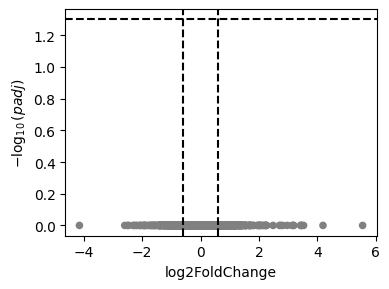

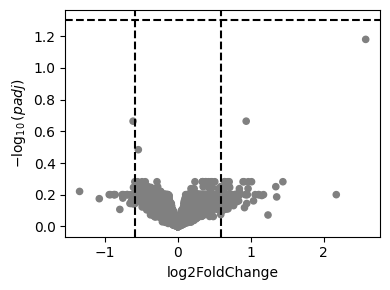

In [33]:
# visualise results via volcano plot 

dc.pl.volcano(results_PD, x="log2FoldChange", y="padj", thr_stat=0.585)

dc.pl.volcano(results_AD, x="log2FoldChange", y="padj", thr_stat=0.585)



Age-associated B cells


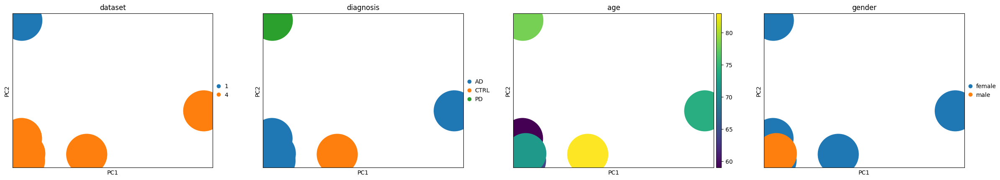

   skip PD: too few samples {'CTRL': np.int64(1), 'PD': np.int64(1)}
   skip AD: too few samples {'AD': np.int64(4), 'CTRL': np.int64(1)}

CD16+ NK cells


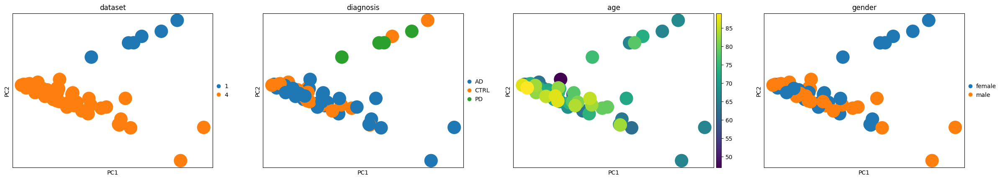

Fitting size factors...
... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01409    12.357587        0.297854  0.588493  0.506131  0.612765  0.999842
LINC01128    22.707824       -0.158700  0.333765 -0.475484  0.634442  0.999842
LINC00115    82.139010        0.694124  0.677412  1.024670  0.305519  0.999842
NOC2L        94.329165        0.163213  0.185255  0.881016  0.378309  0.999842
KLHL17       12.806989       -0.413829  0.628845 -0.658078  0.510488  0.999842
...                ...             ...       ...       ...       ...       ...
MT-ND4L    2447.700029       -0.313184  0.363350 -0.861936  0.388723  0.999842
MT-ND4     3117.913423       -0.075970  0.313003 -0.242715  0.808226  0.999842
MT-ND5     2423.425995        0.320037  0.371496  0.861482  0.388972  0.999842
MT-ND6      727.318697       -0.535707  0.396637 -1.350623  0.176816  0.999842
MT-CYB     5776.128411       -0.217693  0.328332 -0.663028  0.507312  0.

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
Fitting dispersions...
... done in 1.47 s

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01409    11.363125       -0.271534  0.188220 -1.442645  0.149120  0.870891
LINC01128    26.538369       -0.026065  0.130403 -0.199883  0.841572  0.981520
LINC00115   100.489307       -0.306914  0.144880 -2.118411  0.034140  0.870891
NOC2L       100.430041       -0.042185  0.066325 -0.636041  0.524750  0.928144
KLHL17       16.657516       -0.097218  0.128495 -0.756591  0.449295  0.915448
...                ...             ...       ...       ...       ...       ...
MT-ND4L    3145.079769       -0.162063  0.135653 -1.194692  0.232207  0.870891
MT-ND4     2507.202197       -0.212262  0.119610 -1.774623  0.075960  0.870891
MT-ND5     2667.464285       -0.220111  0.134132 -1.640999  0.100798  0.870891
MT-ND6      946.064882       -0.142428  0.136760 -1.041451  0.297666  0.881004
MT-CYB     6419.348441       -0.209863  0.124824 -1.681264  0.092712  0.

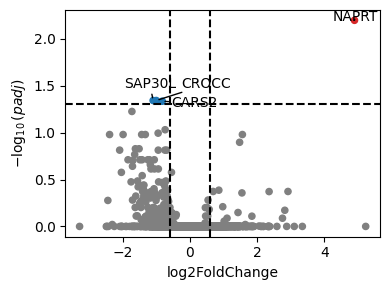

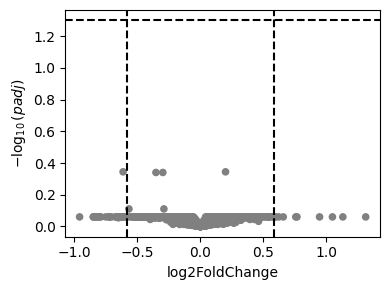

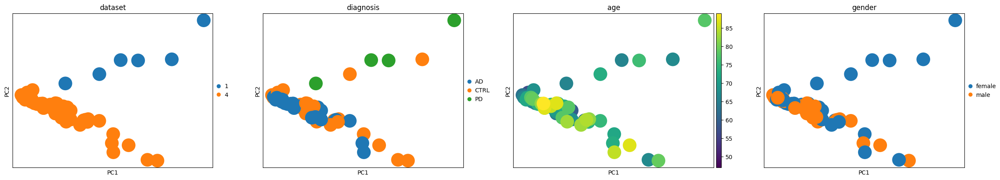

Fitting size factors...
... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
LINC01409     6.935429        0.040909  0.567976  0.072026  0.942581  0.99995
LINC01128    10.198761       -0.310832  0.606247 -0.512715  0.608151  0.99995
LINC00115    55.292445        0.087882  0.641589  0.136976  0.891050  0.99995
NOC2L        46.724495       -0.154256  0.232633 -0.663089  0.507273  0.99995
HES4         14.921562       -0.396800  1.412414 -0.280937  0.778758  0.99995
...                ...             ...       ...       ...       ...      ...
MT-ND4L     900.398866       -0.359528  0.487256 -0.737862  0.460598  0.99995
MT-ND4     3718.865062       -0.248014  0.382116 -0.649054  0.516303  0.99995
MT-ND5     1373.599827        0.079234  0.464865  0.170446  0.864660  0.99995
MT-ND6      306.555965       -0.845791  0.535051 -1.580766  0.113932  0.99995
MT-CYB     3270.244751       -0.419611  0.398513 -1.052943  0.292367  0.99995

[102

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    52.082979        0.078994  0.149163  0.529581  0.596403  0.897631
NOC2L        37.909735       -0.013433  0.080600 -0.166663  0.867635  0.973560
HES4         18.740895        1.103317  0.508086  2.171515  0.029892  0.630222
ISG15       130.102992       -0.030477  0.218688 -0.139364  0.889163  0.978874
C1orf159     11.877158        0.018152  0.129417  0.140257  0.888457  0.978874
...                ...             ...       ...       ...       ...       ...
MT-ND4L     772.589248       -0.162162  0.166105 -0.976259  0.328936  0.813323
MT-ND4     2141.359029       -0.190037  0.143794 -1.321591  0.186304  0.766578
MT-ND5      994.215668       -0.286471  0.147716 -1.939338  0.052460  0.650191
MT-ND6      254.521283       -0.283571  0.162344 -1.746735  0.080683  0.689776
MT-CYB     2299.403969       -0.175375  0.139725 -1.255144  0.209427  0.

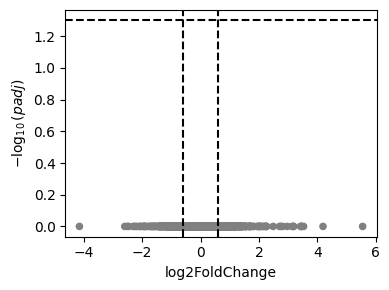

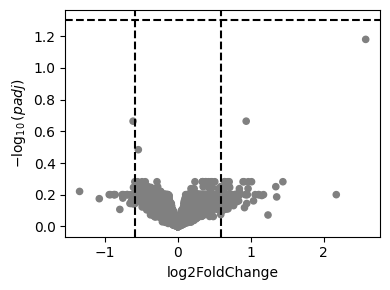

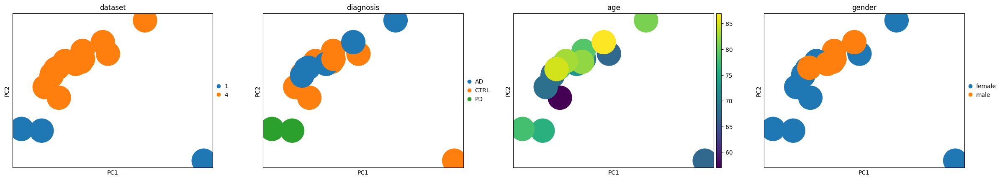

Fitting size factors...
... done in 0.01 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    13.385348        1.349999  2.190877  0.616191  0.537768  0.999241
NOC2L        25.290144       -0.058635  0.674973 -0.086871  0.930774  0.999241
ISG15        80.053350        1.872725  1.481395  1.264163  0.206172  0.999241
SDF4         36.205288       -0.215411  0.621906 -0.346372  0.729063  0.999241
B3GALT6       6.203363       -0.765337  1.498515 -0.510730  0.609540  0.999241
...                ...             ...       ...       ...       ...       ...
MT-ND4L     357.843540        0.203834  0.655651  0.310888  0.755886  0.999241
MT-ND4      818.909990        0.165744  0.466361  0.355398  0.722291  0.999241
MT-ND5      379.784861        0.815783  0.533792  1.528278  0.126444  0.999241
MT-ND6       99.346494       -0.055003  0.924792 -0.059476  0.952573  0.999241
MT-CYB     1072.718007       -0.165918  0.460450 -0.360339  0.718594  0.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
Fitting dispersions...
... done in 0.76 s

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    18.428663        0.603021  0.375026  1.607945  0.107847  0.999748
NOC2L        25.069680       -0.388763  0.262953 -1.478450  0.139287  0.999748
ISG15        44.008052       -0.310944  0.503292 -0.617820  0.536694  0.999748
SDF4         46.601827        0.230984  0.246675  0.936392  0.349071  0.999748
UBE2J2       25.373678        0.310942  0.242978  1.279714  0.200646  0.999748
...                ...             ...       ...       ...       ...       ...
MT-ND4L     489.160097        0.301866  0.332344  0.908294  0.363723  0.999748
MT-ND4      600.367543        0.106087  0.261444  0.405773  0.684910  0.999748
MT-ND5      442.703488        0.298035  0.294839  1.010839  0.312094  0.999748
MT-ND6      143.609944        0.443449  0.285777  1.551731  0.120727  0.999748
MT-CYB     1174.128161        0.188887  0.290674  0.649826  0.515805  0.

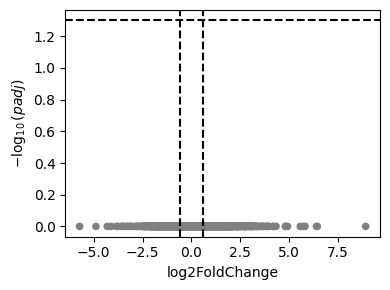

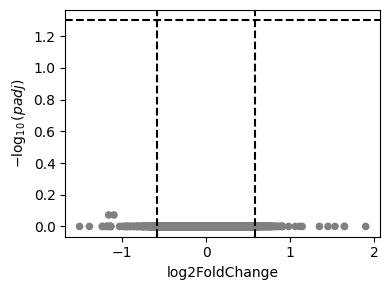

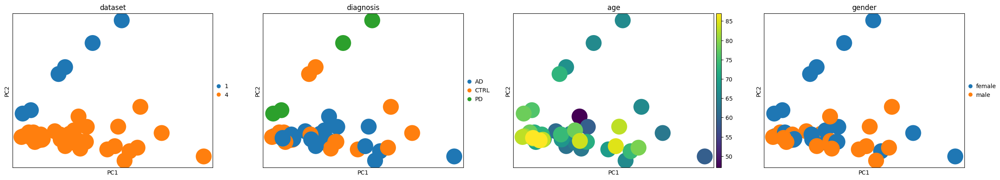

Fitting size factors...
... done in 0.01 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.88 seconds.

Fitting dispersion trend curve...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.88 seconds.

Fitting LFCs...
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    10.234900       -0.475789  1.897491 -0.250746  0.802010  0.999696
NOC2L        16.878006       -0.164444  0.397401 -0.413799  0.679021  0.999696
ISG15        43.481748        0.738855  0.438941  1.683266  0.092324  0.999696
TNFRSF4       5.938321        0.655060  0.791684  0.827426  0.407996  0.999696
SDF4         32.413167       -1.316105  0.455659 -2.888357  0.003873  0.557250
...                ...             ...       ...       ...       ...       ...
MT-ND4L     550.367497       -0.113047  0.439660 -0.257124  0.797083  0.999696
MT-ND4      873.252724       -0.126510  0.306703 -0.412483  0.679985  0.999696
MT-ND5      541.621365        0.442029  0.376839  1.172993  0.240798  0.999696
MT-ND6      121.198978       -0.816853  0.482449 -1.693138  0.090429  0.999696
MT-CYB     1714.779513       -0.288819  0.369851 -0.780906  0.434858  0.

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.95 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.92 seconds.

Fitting LFCs...
... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    16.445452        0.080998  0.173984  0.465547  0.641540  0.998594
NOC2L        19.553981        0.066315  0.142469  0.465469  0.641596  0.998594
ISG15        40.955736       -0.052546  0.175408 -0.299563  0.764511  0.998594
SDF4         43.285832       -0.072397  0.093972 -0.770415  0.441054  0.998594
B3GALT6      12.452018       -0.210819  0.164778 -1.279416  0.200751  0.998594
...                ...             ...       ...       ...       ...       ...
MT-ND4L     779.945122       -0.172146  0.183295 -0.939175  0.347641  0.998594
MT-ND4      656.700272       -0.165436  0.155145 -1.066335  0.286272  0.998594
MT-ND5      593.377118       -0.214292  0.166429 -1.287587  0.197890  0.998594
MT-ND6      166.362960       -0.183871  0.175072 -1.050261  0.293598  0.998594
MT-CYB     1906.890552       -0.232057  0.155368 -1.493596  0.135281  0.

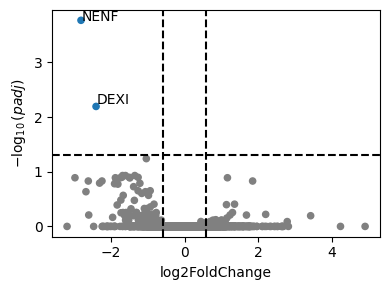

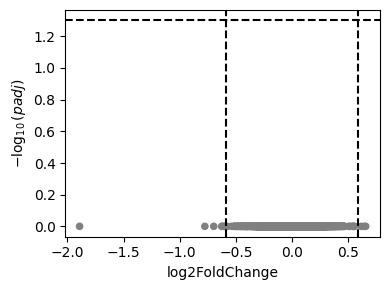

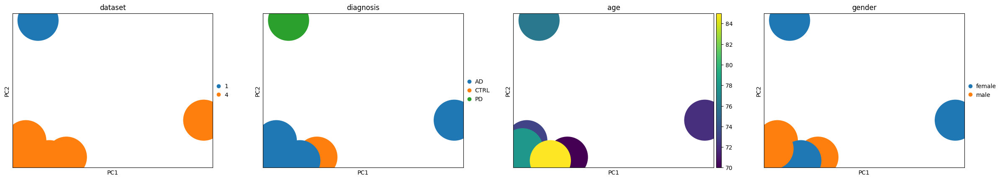

   skip PD: too few samples {'CTRL': np.int64(1), 'PD': np.int64(1)}
   skip AD: too few samples {'AD': np.int64(4), 'CTRL': np.int64(1)}

Memory B cells


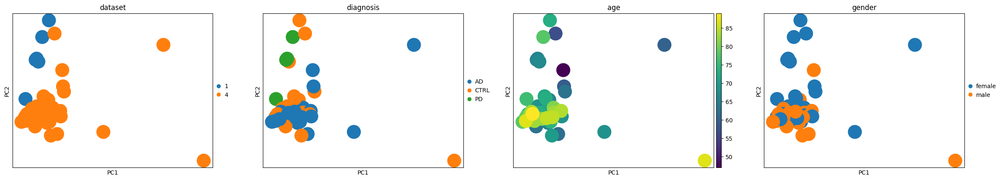

Fitting size factors...
... done in 0.01 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01128     7.244246       -0.006897  0.653919 -0.010547  0.991585  0.999688
LINC00115    30.857632        0.600666  2.914026  0.206129  0.836690  0.999688
NOC2L        28.905722       -0.101812  0.300180 -0.339172  0.734480  0.999688
ISG15        57.185861        1.244132  0.509096  2.443804  0.014533  0.937028
C1orf159      6.112659       -1.308864  0.880611 -1.486313  0.137196  0.999688
...                ...             ...       ...       ...       ...       ...
MT-ND4L     939.075633       -0.032035  0.363314 -0.088174  0.929739  0.999688
MT-ND4     1492.726982       -0.120144  0.271269 -0.442897  0.657840  0.999688
MT-ND5      783.917137        0.375290  0.338811  1.107668  0.268005  0.999688
MT-ND6      267.089672       -0.323286  0.452454 -0.714517  0.474908  0.999688
MT-CYB     2448.344346       -0.276842  0.299716 -0.923683  0.355651  0.

Fitting size factors...
... done in 0.03 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01128     8.309625        0.165360  0.217346  0.760815  0.446768  0.987454
LINC00115    38.520938       -0.148876  0.166667 -0.893251  0.371723  0.987454
NOC2L        30.487534        0.013718  0.103745  0.132233  0.894800  0.997912
ISG15        43.901857        0.072692  0.156272  0.465164  0.641814  0.991876
SDF4         61.568405        0.102753  0.078011  1.317168  0.187782  0.987454
...                ...             ...       ...       ...       ...       ...
MT-ND4L    1207.032491        0.016101  0.148553  0.108387  0.913688  0.997912
MT-ND4     1060.342165       -0.102689  0.122714 -0.836818  0.402695  0.987454
MT-ND5      869.246642       -0.058539  0.126615 -0.462341  0.643837  0.991876
MT-ND6      323.296694       -0.148249  0.130544 -1.135626  0.256113  0.987454
MT-CYB     2570.152605       -0.091765  0.126462 -0.725637  0.468061  0.

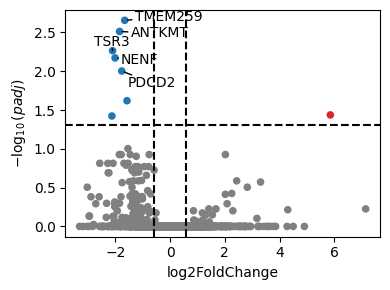

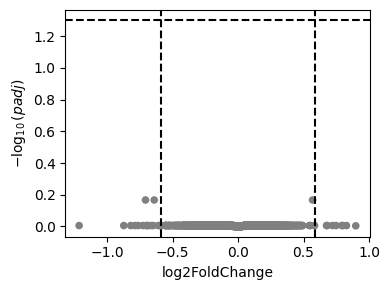

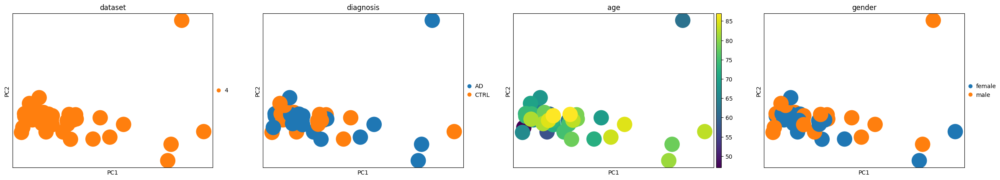

   skip PD: too few samples {'CTRL': np.int64(19)}
   dropping 'dataset' from AD design (single level here)
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.66 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.73 seconds.

Fitting LFCs...
... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.22 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115   14.305379       -0.028536  0.162561 -0.175539  0.860656  0.994555
NOC2L       13.478201       -0.028250  0.146817 -0.192413  0.847419  0.994555
ISG15       22.098306        0.081708  0.190954  0.427897  0.668726  0.994555
TNFRSF18    48.811048        0.329812  0.125049  2.637453  0.008353  0.994555
TNFRSF4     11.211663        0.337743  0.196627  1.717684  0.085854  0.994555
...               ...             ...       ...       ...       ...       ...
MT-ND4L    358.608811       -0.127794  0.162774 -0.785102  0.432394  0.994555
MT-ND4     236.567353       -0.257782  0.133513 -1.930761  0.053513  0.994555
MT-ND5     284.816184       -0.203543  0.149684 -1.359823  0.173886  0.994555
MT-ND6     110.838934       -0.130478  0.151969 -0.858580  0.390572  0.994555
MT-CYB     682.252220       -0.192312  0.153539 -1.252528  0.210378  0.994555

[443

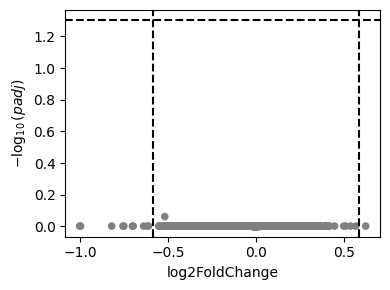

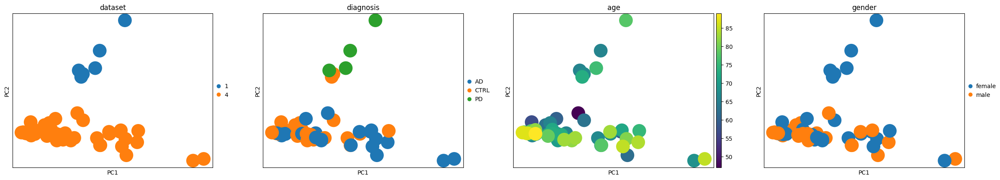

Fitting size factors...
... done in 0.01 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
Fitting dispersions...
... done in 1.17 s

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01128     7.300655       -0.998817  0.481066 -2.076258  0.037870  0.999508
LINC00115    25.910687        0.243025  1.705779  0.142471  0.886708  0.999508
NOC2L        20.625046        0.114632  0.320874  0.357248  0.720906  0.999508
ISG15        23.910634        0.375148  0.644314  0.582244  0.560402  0.999508
TNFRSF18      4.575607       -0.885986  1.221746 -0.725180  0.468341  0.999508
...                ...             ...       ...       ...       ...       ...
MT-ND4L     785.043739       -0.419859  0.369486 -1.136334  0.255817  0.999508
MT-ND4     1038.898585       -0.145024  0.283488 -0.511569  0.608953  0.999508
MT-ND5      621.931908        0.316062  0.332866  0.949515  0.342359  0.999508
MT-ND6      215.317518       -0.504213  0.449773 -1.121041  0.262271  0.999508
MT-CYB     1892.715795       -0.352329  0.292339 -1.205208  0.228123  0.

... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
Fitting disper

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01128     9.168757        0.198155  0.174597  1.134927  0.256406  0.729682
LINC00115    32.532219       -0.077283  0.142541 -0.542183  0.587693  0.880098
NOC2L        21.052338        0.077114  0.119869  0.643323  0.520015  0.853721
ISG15        16.862752       -0.206961  0.203391 -1.017552  0.308891  0.764252
SDF4         32.954452        0.064857  0.112315  0.577457  0.563631  0.872512
...                ...             ...       ...       ...       ...       ...
MT-ND4L     973.628384       -0.053049  0.123198 -0.430603  0.666757  0.913112
MT-ND4      807.337311       -0.085084  0.096723 -0.879662  0.379043  0.795827
MT-ND5      689.451178       -0.128783  0.107794 -1.194717  0.232197  0.708264
MT-ND6      263.460883       -0.111785  0.124265 -0.899566  0.368351  0.791784
MT-CYB     2022.207380       -0.112376  0.104641 -1.073913  0.282862  0.

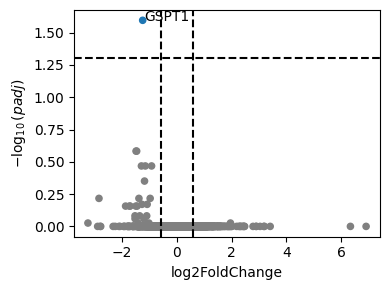

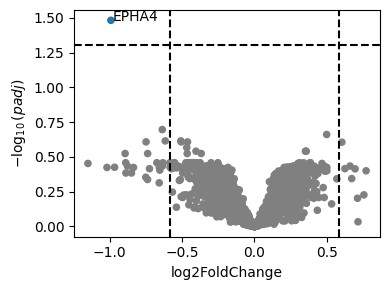

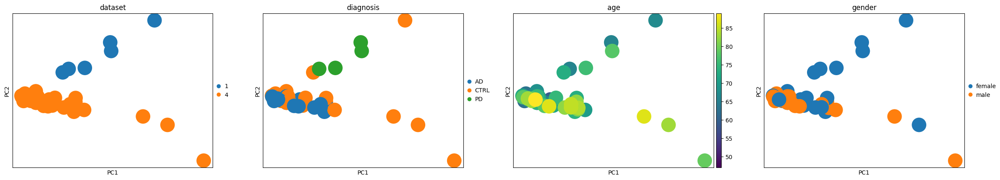

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    24.858586        1.527937  1.218679  1.253765  0.209928  0.999954
NOC2L        48.117047        0.025123  0.274012  0.091687  0.926947  0.999954
HES4        177.552918       -1.445274  1.121967 -1.288161  0.197690  0.999954
ISG15       177.736391        0.893485  0.439852  2.031329  0.042222  0.999954
SDF4         54.339746       -0.669052  0.427453 -1.565206  0.117535  0.999954
...                ...             ...       ...       ...       ...       ...
MT-ND4L     693.709497       -0.274436  0.336070 -0.816602  0.414156  0.999954
MT-ND4     1452.370932       -0.220836  0.239825 -0.920824  0.357142  0.999954
MT-ND5      772.565838        0.030941  0.311911  0.099199  0.920980  0.999954
MT-ND6      196.010991       -0.153730  0.485646 -0.316547  0.751587  0.999954
MT-CYB     2295.211104       -0.420789  0.362673 -1.160243  0.245950  0.

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 1.09 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    23.875063       -0.145557  0.168911 -0.861743  0.388829  0.998463
NOC2L        39.300309       -0.129678  0.111922 -1.158642  0.246602  0.998463
HES4        175.946218        0.155102  0.164058  0.945408  0.344451  0.998463
ISG15        79.935597        0.105075  0.152800  0.687667  0.491662  0.998463
SDF4         50.963976       -0.068712  0.094153 -0.729786  0.465521  0.998463
...                ...             ...       ...       ...       ...       ...
MT-ND4L     649.584062       -0.180195  0.153581 -1.173294  0.240678  0.998463
MT-ND4      832.258803       -0.192762  0.154828 -1.245005  0.213130  0.998463
MT-ND5      637.157627       -0.162481  0.137290 -1.183486  0.236616  0.998463
MT-ND6      185.782089       -0.172659  0.142519 -1.211475  0.225713  0.998463
MT-CYB     1809.047153       -0.259632  0.128636 -2.018343  0.043556  0.

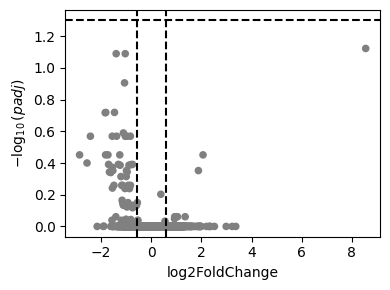

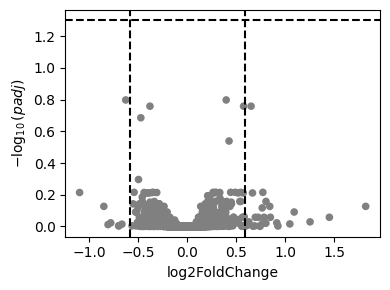

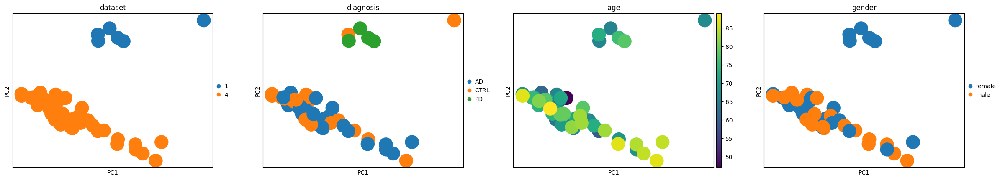

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...
... done in 0.82 seconds.

Fitting LFCs...
... done in 0.68 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.

Fitting size factors...
... done in 0.02 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115    9.467513        2.369983  2.402138  0.986614  0.323832  0.998812
NOC2L       13.161310        0.270707  0.367441  0.736736  0.461283  0.998812
ISG15       54.432901        0.467870  0.456325  1.025299  0.305222  0.998812
TNFRSF18    11.672362        0.150004  0.500742  0.299563  0.764510  0.998812
TNFRSF4     16.481492       -0.046247  0.483654 -0.095620  0.923822  0.998812
...               ...             ...       ...       ...       ...       ...
MT-ND4L    254.739708       -0.352538  0.457022 -0.771382  0.440481  0.998812
MT-ND4     356.096298       -0.243472  0.302281 -0.805450  0.420560  0.998812
MT-ND5     243.409951        0.223896  0.362024  0.618456  0.536275  0.998812
MT-ND6      78.018579       -0.892849  0.442970 -2.015598  0.043842  0.998812
MT-CYB     787.369969       -0.342110  0.311138 -1.099543  0.271531  0.998812

[604

Fitting dispersions...
... done in 0.70 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.78 seconds.

Fitting LFCs...
... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.24 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115   11.249329       -0.247402  0.151922 -1.628476  0.103424  0.997196
NOC2L       13.256077       -0.126545  0.150778 -0.839282  0.401311  0.997196
ISG15       42.326712        0.079865  0.140097  0.570065  0.568633  0.997196
TNFRSF18    11.642015       -0.098710  0.189243 -0.521606  0.601945  0.997196
TNFRSF4     19.105035        0.210627  0.174246  1.208789  0.226744  0.997196
...               ...             ...       ...       ...       ...       ...
MT-ND4L    324.585169       -0.095461  0.130262 -0.732835  0.463659  0.997196
MT-ND4     252.954677       -0.121075  0.105854 -1.143792  0.252710  0.997196
MT-ND5     269.242887       -0.089264  0.115649 -0.771851  0.440203  0.997196
MT-ND6      97.955347       -0.055301  0.133186 -0.415213  0.677986  0.997196
MT-CYB     823.317162       -0.137020  0.100647 -1.361399  0.173388  0.997196

[489

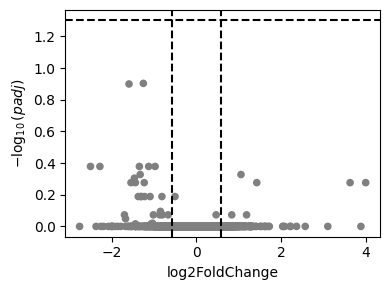

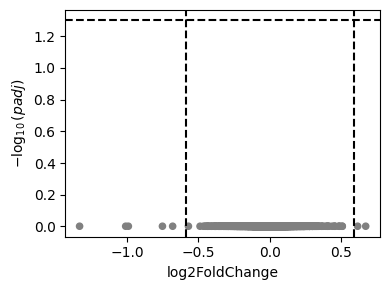

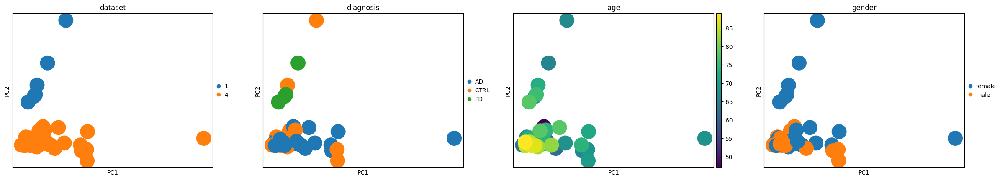

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.68 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.74 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.25 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC00115     8.669582        1.364443  2.639659  0.516901  0.605225  0.999947
NOC2L        12.939508        0.006620  0.392555  0.016865  0.986545  0.999947
ISG15        18.550573        0.645700  0.433750  1.488643  0.136581  0.999947
SDF4         18.805411       -0.490520  0.446019 -1.099774  0.271431  0.999947
B3GALT6       5.864235       -0.985399  1.124751 -0.876104  0.380973  0.999947
...                ...             ...       ...       ...       ...       ...
MT-ND4L     332.515339       -0.273970  0.483082 -0.567129  0.570627  0.999947
MT-ND4      598.925937       -0.099465  0.341702 -0.291087  0.770985  0.999947
MT-ND5      278.942986        0.678908  0.431420  1.573659  0.115566  0.999947
MT-ND6       70.227068       -0.921674  0.454569 -2.027577  0.042603  0.999947
MT-CYB     1047.691327       -0.359621  0.390478 -0.920976  0.357063  0.

Fitting dispersions...
... done in 0.66 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.69 seconds.

Fitting LFCs...
... done in 0.41 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.22 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
LINC00115    12.192991       -0.218699  0.188778 -1.158495  0.246662  0.99992
NOC2L        13.237430       -0.307809  0.148962 -2.066359  0.038795  0.99992
ISG15        18.246963        0.153707  0.215777  0.712340  0.476254  0.99992
SDF4         27.204835        0.126967  0.116689  1.088072  0.276563  0.99992
UBE2J2       16.392408        0.150511  0.139945  1.075500  0.282151  0.99992
...                ...             ...       ...       ...       ...      ...
MT-ND4L     478.905585       -0.067744  0.179756 -0.376866  0.706273  0.99992
MT-ND4      453.662994       -0.176870  0.147954 -1.195436  0.231917  0.99992
MT-ND5      319.541933       -0.120221  0.160061 -0.751098  0.452594  0.99992
MT-ND6       94.866549       -0.137638  0.142068 -0.968813  0.332639  0.99992
MT-CYB     1172.617891       -0.175726  0.157990 -1.112263  0.266025  0.99992

[434

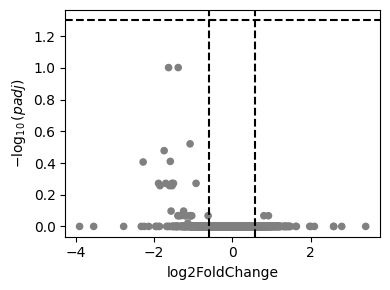

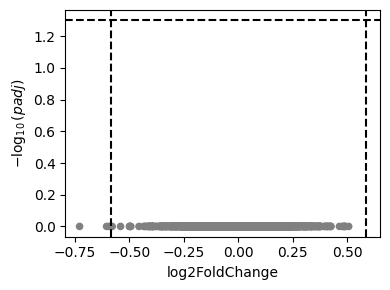

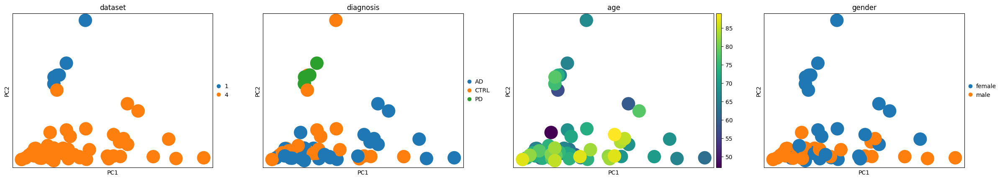

Fitting size factors...
... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
               baseMean  log2FoldChange     lfcSE      stat    pvalue    padj
LINC01409     20.957202        0.231256  0.617768  0.374341  0.708151  0.9999
LINC01128     53.171900       -0.155704  0.334288 -0.465778  0.641374  0.9999
LINC00115    171.072947        1.037014  0.858501  1.207936  0.227072  0.9999
NOC2L        166.854855        0.049047  0.170378  0.287870  0.773446  0.9999
KLHL17        20.828346       -0.548838  0.651745 -0.842105  0.399729  0.9999
...                 ...             ...       ...       ...       ...     ...
MT-ND4L     4980.681144       -0.337059  0.399939 -0.842776  0.399354  0.9999
MT-ND4      6916.181363       -0.222711  0.308047 -0.722977  0.469694  0.9999
MT-ND5      4375.585337        0.544150  0.423976  1.283445  0.199336  0.9999
MT-ND6      1244.827433       -0.597437  0.442132 -1.351265  0.176610  0.9999
MT-CYB     14640.696145       -0.362482  0.340516 -1.064506  0.287099  0.9999

[117

Fitting size factors...
... done in 0.03 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
LINC01409     18.990826       -0.431157  0.189284 -2.277830  0.022737   
LINC01128     60.015375       -0.099865  0.099415 -1.004529  0.315124   
LINC00115    214.896285       -0.316498  0.132430 -2.389928  0.016852   
NOC2L        190.572678        0.062165  0.057692  1.077521  0.281247   
KLHL17        28.942141        0.032846  0.102752  0.319662  0.749224   
...                 ...             ...       ...       ...       ...   
MT-ND4L     6543.192665       -0.173652  0.132204 -1.313519  0.189008   
MT-ND4      5846.423884       -0.184682  0.107040 -1.725360  0.084463   
MT-ND5      4923.854175       -0.234352  0.127078 -1.844158  0.065160   
MT-ND6      1569.232106       -0.234759  0.137999 -1.701163  0.088912   
MT-CYB     16439.155122       -0.207943  0.110618 -1.879828  0.060132   

               padj  
LINC01409  0.223368  
LINC01128  0.600327 

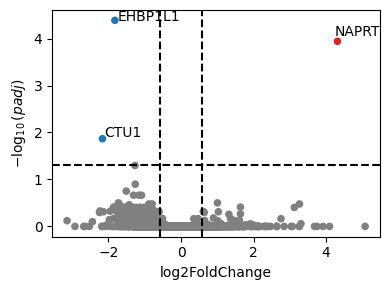

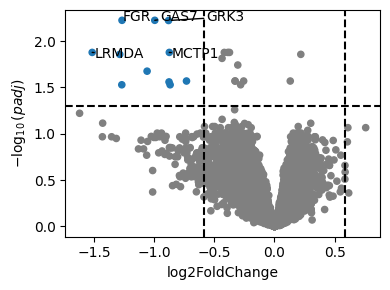

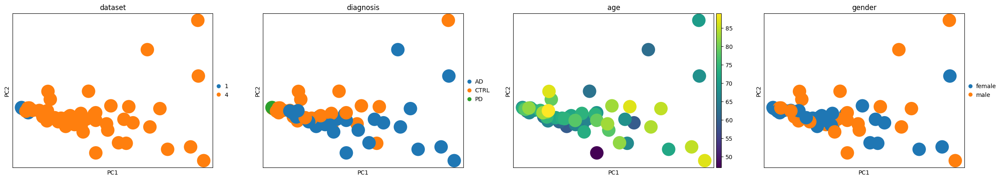

Fitting size factors...
... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01409     5.396250        0.252979  1.115677  0.226749  0.820619       NaN
LINC01128    15.073896       -0.110463  0.653601 -0.169007  0.865791       NaN
LINC00115    42.002101        0.940623  2.664715  0.352992  0.724095  0.999995
NOC2L        58.436195        0.458819  0.343558  1.335491  0.181716  0.999995
KLHL17        8.632366        0.896385  2.666433  0.336174  0.736740       NaN
...                ...             ...       ...       ...       ...       ...
MT-ND4L    1623.714270       -0.442697  0.471374 -0.939163  0.347647  0.999995
MT-ND4     2100.381133       -0.272710  0.344077 -0.792583  0.428021  0.999995
MT-ND5     1553.358083        0.370313  0.468500  0.790423  0.429281  0.999995
MT-ND6      403.526545       -1.179467  0.486852 -2.422638  0.015408  0.684413
MT-CYB     4870.628236       -0.442719  0.351588 -1.259198  0.207959  0.

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01409     8.752811       -0.020630  0.207958 -0.099203  0.920977  0.999951
LINC01128    28.623702        0.157281  0.105403  1.492188  0.135650  0.999951
LINC00115    84.693240       -0.129116  0.112547 -1.147222  0.251290  0.999951
NOC2L        97.172495       -0.085385  0.058865 -1.450525  0.146912  0.999951
KLHL17       17.481054       -0.126383  0.111904 -1.129385  0.258735  0.999951
...                ...             ...       ...       ...       ...       ...
MT-ND4L    3255.517913       -0.150399  0.147580 -1.019098  0.308157  0.999951
MT-ND4     2750.203024       -0.172342  0.117509 -1.466632  0.142476  0.999951
MT-ND5     2670.820941       -0.203763  0.131446 -1.550168  0.121101  0.999951
MT-ND6      791.031320       -0.172421  0.125301 -1.376055  0.168805  0.999951
MT-CYB     8406.719972       -0.197370  0.113502 -1.738910  0.082051  0.

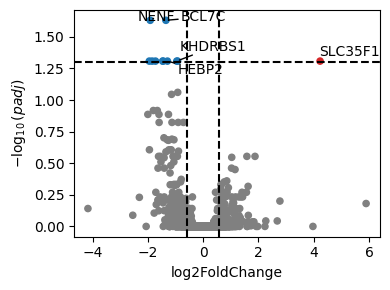

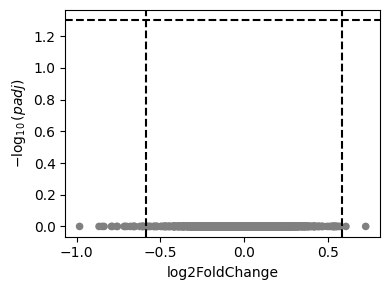

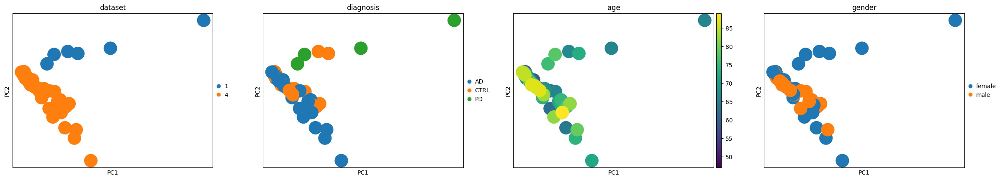

Fitting size factors...
... done in 0.02 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01409    10.620475        0.071503  0.394837  0.181094  0.856293  0.999914
LINC01128    15.503568       -0.351746  0.394594 -0.891411  0.372709  0.999914
LINC00115    77.412025        0.150935  0.627367  0.240585  0.809876  0.999914
NOC2L        87.430975       -0.009773  0.144676 -0.067552  0.946143  0.999914
KLHL17       13.680206       -0.712535  0.648762 -1.098300  0.272074  0.999914
...                ...             ...       ...       ...       ...       ...
MT-ND4L    2558.140793       -0.159137  0.415936 -0.382600  0.702017  0.999914
MT-ND4     3443.379320       -0.096386  0.367156 -0.262520  0.792921  0.999914
MT-ND5     2654.300290        0.452592  0.421395  1.074032  0.282808  0.999914
MT-ND6      739.656318       -0.313913  0.418321 -0.750411  0.453007  0.999914
MT-CYB     6930.611644       -0.273858  0.365800 -0.748653  0.454066  0.

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.52 seconds.

Fitting dispersion trend curve...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 1.54 seconds.

Fitting LFCs...
... done in 1.01 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01128    13.398771        0.148226  0.149184  0.993580  0.320427  0.912479
LINC00115    67.586937       -0.286811  0.137789 -2.081518  0.037387  0.848783
NOC2L        65.441331       -0.057256  0.057886 -0.989120  0.322604  0.915228
KLHL17       12.501623        0.041532  0.138724  0.299385  0.764647  0.978001
ISG15       128.630512       -0.108511  0.124077 -0.874548  0.381820  0.921864
...                ...             ...       ...       ...       ...       ...
MT-ND4L    2369.976858       -0.128884  0.139019 -0.927098  0.353875  0.919450
MT-ND4     2048.499556       -0.135316  0.121818 -1.110809  0.266651  0.899394
MT-ND5     2082.670490       -0.181233  0.131514 -1.378058  0.168185  0.887287
MT-ND6      692.247350       -0.118803  0.130809 -0.908213  0.363766  0.920812
MT-CYB     5563.841469       -0.130702  0.123751 -1.056175  0.290888  0.

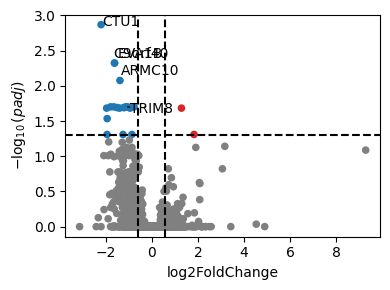

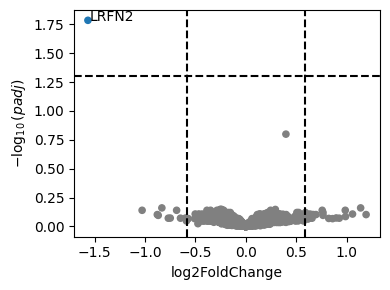

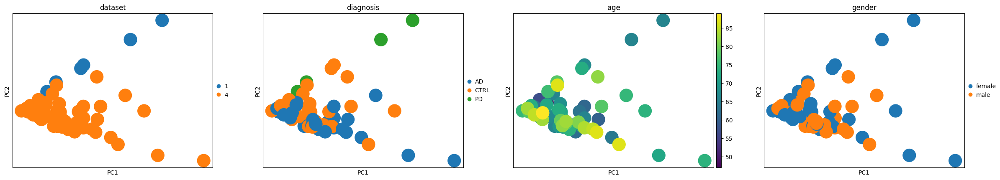

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
Fitting dispersions...
... done in 1.33 s

Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
LINC01409     6.959153       -0.226753  0.733427 -0.309170  0.757193  0.99998
LINC01128    12.655216       -0.070525  0.494398 -0.142649  0.886568  0.99998
LINC00115    57.472466        0.957237  1.222615  0.782942  0.433661  0.99998
NOC2L        55.377070        0.056798  0.262083  0.216717  0.828429  0.99998
KLHL17        8.553657       -0.655315  0.981348 -0.667770  0.504280  0.99998
...                ...             ...       ...       ...       ...      ...
MT-ND4L    1806.550989       -0.189627  0.361944 -0.523912  0.600340  0.99998
MT-ND4     2337.472200       -0.289098  0.283610 -1.019350  0.308037  0.99998
MT-ND5     1716.680032        0.359974  0.342288  1.051669  0.292951  0.99998
MT-ND6      493.012783       -0.624751  0.436895 -1.429981  0.152723  0.99998
MT-CYB     5141.654502       -0.481798  0.301774 -1.596551  0.110366  0.99998

[983

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.30 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 1.47 seconds.

Fitting LFCs...
... done in 0.94 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.42 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01128    13.643748       -0.096940  0.145999 -0.663978  0.506704  0.721256
LINC00115    64.834856       -0.315599  0.152023 -2.075997  0.037894  0.237291
NOC2L        55.347518        0.059946  0.083899  0.714501  0.474917  0.700698
KLHL17       10.567520       -0.005990  0.135063 -0.044347  0.964628  0.984312
ISG15        94.260593        0.090035  0.140207  0.642158  0.520770  0.729404
...                ...             ...       ...       ...       ...       ...
MT-ND4L    2140.205339       -0.148624  0.123114 -1.207203  0.227354  0.488900
MT-ND4     1808.846142       -0.142049  0.105846 -1.342041  0.179583  0.442267
MT-ND5     1756.554578       -0.181427  0.118781 -1.527414  0.126658  0.378941
MT-ND6      577.055124       -0.166125  0.140055 -1.186146  0.235565  0.496739
MT-CYB     5296.757319       -0.167723  0.101500 -1.652448  0.098443  0.

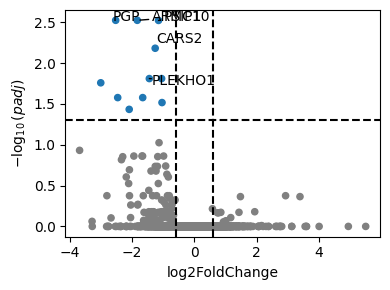

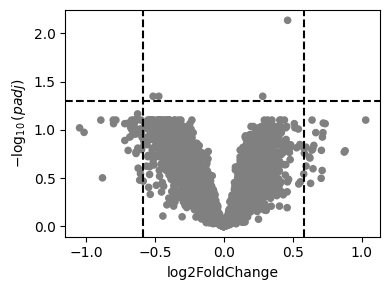

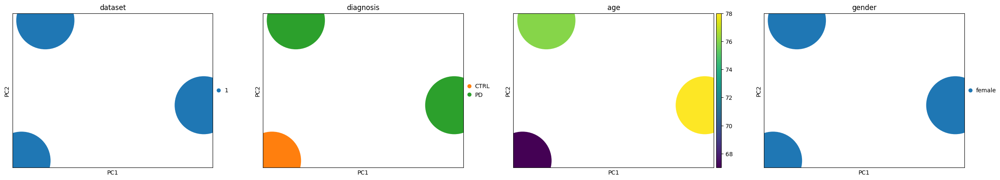

   skip PD: too few samples {'PD': np.int64(2), 'CTRL': np.int64(1)}
   skip AD: too few samples {'CTRL': np.int64(1)}

Global FDR<0.05: 27 gene-hits across all cell types/contrasts


,gene,cell_type,contrast,log2FoldChange,stat,padj,padj_global
145927,EHBP1L1,Tcm/Naive helper T cells,PD_vs_CTRL,-1.822724,-5.906901,0.000041,0.000771
54038,NENF,MAIT cells,PD_vs_CTRL,-2.817161,-5.576111,0.000170,0.001814
144633,NAPRT,Tcm/Naive helper T cells,PD_vs_CTRL,4.314401,5.616425,0.000114,0.001814
191770,CTU1,Tem/Temra cytotoxic T cells,PD_vs_CTRL,-2.204378,-5.274184,0.001349,0.007376
73965,TMEM259,Memory B cells,PD_vs_CTRL,-1.653171,-5.157774,0.002207,0.011059
206198,ARMC10,Tem/Trm cytotoxic T cells,PD_vs_CTRL,-1.836896,-5.058809,0.002982,0.015558
4587,NAPRT,CD16+ NK cells,PD_vs_CTRL,4.898538,4.993111,0.006342,0.016775
209410,PGP,Tem/Trm cytotoxic T cells,PD_vs_CTRL,-2.531495,-4.989138,0.002982,0.016775
72953,ANTKMT,Memory B cells,PD_vs_CTRL,-1.840127,-4.962426,0.003075,0.017116
206701,PSIP1,Tem/Trm cytotoxic T cells,PD_vs_CTRL,-1.153193,-4.909524,0.002993,0.018365


In [ ]:
# =====================================================================
# Per-cell-type DE loop — mirrors the current Classical-monocytes workflow
#   * PD vs CTRL and AD vs CTRL run as SEPARATE objects/contrasts
#   * lowly-expressed genes filtered independently per contrast
#   * BH/FDR within each contrast (DESeq2 'padj') PLUS a second global
#     BH across every cell type x contrast actually tested
# =====================================================================
warnings.filterwarnings("ignore")       
inference = DefaultInference(n_cpus=8)

cell_types = pdata.obs["celltypist_cell_label_fine"].unique().tolist()

MIN_SAMPLES_PER_GROUP = 2      # need >=2 samples each side to fit a contrast
LFC_THR = 0.585              # ~1.5 fold
# LFC_THR = 0                    # trying removing the LFC threshold
FDR_THR = 0.05

def run_one_contrast(pdata_ct, disease, base_design):
    """Run one <disease> vs CTRL contrast for one cell type, following the
    manual monocyte steps. Returns DESeq2 results_df (with within-contrast
    padj) or None if the contrast cannot be fit."""

    # 1. keep only the two diagnosis groups for this contrast
    sub = pdata_ct[pdata_ct.obs["diagnosis"].isin(["CTRL", disease])].copy()

    # need both groups present with enough samples, else skip
    n_per_group = sub.obs["diagnosis"].value_counts()
    if (n_per_group.get("CTRL", 0) < MIN_SAMPLES_PER_GROUP or
            n_per_group.get(disease, 0) < MIN_SAMPLES_PER_GROUP):
        print(f"   skip {disease}: too few samples {dict(n_per_group)}")
        return None

    # 2. filter lowly-expressed genes for THIS contrast's samples only
    dc.pp.filter_by_expr(sub, group="diagnosis")

    # 3. build counts (samples x genes) + metadata frames
    counts_df = pd.DataFrame(sub.X, columns=sub.var_names,
                             index=sub.obs["sample_combined"])
    metadata = sub.obs[["dataset", "diagnosis", "age", "gender"]].copy()
    metadata.index = counts_df.index
    metadata["diagnosis"] = pd.Categorical(metadata["diagnosis"],
                                           categories=["CTRL", disease])  # CTRL = reference

    # 4. drop any categorical covariate with a single level in this subset,
    #    otherwise the design matrix is rank-deficient and DESeq2 fails
    design_terms = []
    for term in base_design:
        if term in ("dataset", "gender") and metadata[term].astype(str).nunique() < 2:
            print(f"   dropping '{term}' from {disease} design (single level here)")
            continue
        design_terms.append(term)
    design = "~" + " + ".join(["diagnosis"] + design_terms)

    # 5. fit DESeq2, Wald test (BH within-contrast -> padj)
    dds = DeseqDataSet(counts=counts_df, metadata=metadata,
                       design=design, refit_cooks=True, inference=inference)
    dds.deseq2()
    ds = DeseqStats(dds, contrast=["diagnosis", disease, "CTRL"], inference=inference)
    ds.summary()
    return ds.results_df


all_results = []   # collected for the global FDR pass

for cell_type in cell_types:
    print(f"\n{'='*60}\n{cell_type}\n{'='*60}")
    mask = pdata.obs["celltypist_cell_label_fine"] == cell_type
    pdata_ct = pdata[mask].copy()

    # cell-type-specific PCA (QC only — not used by DESeq2)
    try:
        sc.tl.pca(pdata_ct, n_comps=min(50, pdata_ct.n_obs - 1))
        sc.pl.pca(pdata_ct, color=["dataset", "diagnosis", "age", "gender"])
    except Exception as e:
        print(f"   PCA skipped: {e}")
    # -------------------------------------------------------------------------

    for disease, base_design in [("PD", ["dataset", "age", "gender"]),
                                 ("AD", ["dataset", "age", "gender"])]:
        try:
            res = run_one_contrast(pdata_ct, disease, base_design)
        except Exception as e:
            print(f"   {disease} contrast failed: {e}")
            res = None
        if res is None:
            continue

        res = res.copy()
        res["cell_type"] = cell_type
        res["contrast"]  = f"{disease}_vs_CTRL"
        res["gene"]      = res.index
        all_results.append(res)

        n_sig = ((res["padj"] < FDR_THR) &
                 (res["log2FoldChange"].abs() > LFC_THR)).sum()
        print(f"   {disease} vs CTRL: {n_sig} sig genes "
              f"(within-contrast FDR<{FDR_THR}, |LFC|>{LFC_THR})")

        # volcano uses within-contrast padj (your volcano_plot already does)
        dc.pl.volcano(res, x="log2FoldChange", y="padj", thr_stat=0.585)

# ---------------------------------------------------------------------
# GLOBAL multiple-testing correction across every cell type x contrast.
# DESeq2's padj only corrects within one contrast; pooling here accounts
# for having run many contrasts.
# ---------------------------------------------------------------------
de_all = pd.concat(all_results, ignore_index=True)
ok = de_all["pvalue"].notna()
de_all["padj_global"] = np.nan
de_all.loc[ok, "padj_global"] = multipletests(de_all.loc[ok, "pvalue"],
                                               method="fdr_bh")[1]

sig_global = de_all[(de_all["padj_global"] < FDR_THR) &
                    (de_all["log2FoldChange"].abs() > LFC_THR)]
print(f"\nGlobal FDR<{FDR_THR}: {len(sig_global)} gene-hits "
      f"across all cell types/contrasts")
sig_global.sort_values("padj_global")[
    ["gene", "cell_type", "contrast", "log2FoldChange", "stat", "padj", "padj_global"]
]


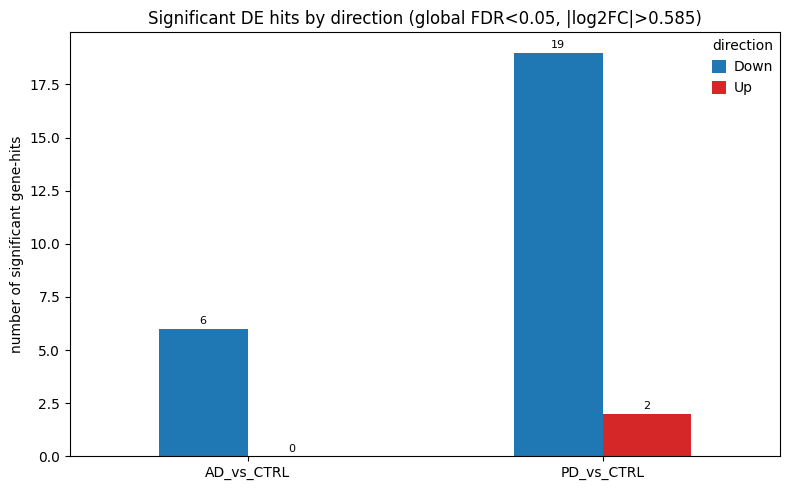

In [35]:
# --- up/down direction of each significant hit ---
sig = sig_global.copy()
sig["direction"] = np.where(sig["log2FoldChange"] > 0, "Up", "Down")

# counts per contrast, plus an 'Overall' row pooling all contrasts
counts = sig.groupby(["contrast", "direction"]).size().unstack(fill_value=0).reindex(columns=["Down", "Up"], fill_value=0)

# --- grouped bar chart ---
ax = counts.plot(kind="bar", figsize=(8, 5),
                 color={"Down": "#1f77b4", "Up": "#d62728"})  # blue=down, red=up
ax.set_ylabel("number of significant gene-hits")
ax.set_xlabel("")
ax.set_title(f"Significant DE hits by direction (global FDR<{FDR_THR}, |log2FC|>{LFC_THR})")
ax.set_xticklabels(counts.index, rotation=0)
ax.legend(title="direction")
for c in ax.containers:          # annotate counts on top of bars
    ax.bar_label(c, padding=2, fontsize=8)
plt.tight_layout()
plt.show()


In [36]:
# ### Correlation analysis between PD and AD DE results

# rows, scatter = [], {}

# for ct in de_all["cell_type"].unique():
#     pd_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "PD_vs_CTRL")]
#     ad_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "AD_vs_CTRL")]

#     # genes tested in BOTH contrasts (filter_by_expr was per-contrast, so intersect)
#     m = (pd_res.merge(ad_res, on="gene", suffixes=("_PD", "_AD"))
#                .dropna(subset=["stat_PD", "stat_AD"]))
#     if len(m) < 20:                       # too few shared genes to correlate
#         continue

#     rho, p = spearmanr(m["stat_PD"], m["stat_AD"])
#     rows.append({"cell_type": ct, "n_genes": len(m), "rho": rho, "pval": p})
#     scatter[ct] = m

# corr = pd.DataFrame(rows)
# # BH across the cell-type-level correlation tests  <-- the multiple-testing correction
# corr["padj"] = multipletests(corr["pval"], method="fdr_bh")[1]
# corr["sig"]  = corr["padj"] < 0.05
# corr.sort_values("rho", ascending=False)

,cell_type,n_genes,rho,pval,padj,sig
11,Tem/Temra cytotoxic T cells,9399,0.092560,2.435530e-19,1.583095e-18,True
10,Tem/Effector helper T cells,9744,0.045900,5.823943e-06,1.514225e-05,True
12,Tem/Trm cytotoxic T cells,9090,0.038897,2.077728e-04,4.501744e-04,True
0,CD16+ NK cells,9889,0.034463,6.086397e-04,1.130331e-03,True
6,Non-classical monocytes,6893,0.022025,6.747136e-02,1.096410e-01,False
2,DC2,6186,0.021019,9.831989e-02,1.420176e-01,False
7,Regulatory T cells,4895,0.011950,4.032117e-01,5.080947e-01,False
9,Tcm/Naive helper T cells,10895,0.007563,4.299263e-01,5.080947e-01,False
8,Tcm/Naive cytotoxic T cells,4338,0.000753,9.604765e-01,9.604765e-01,False
1,Classical monocytes,9044,-0.003442,7.434677e-01,8.054233e-01,False


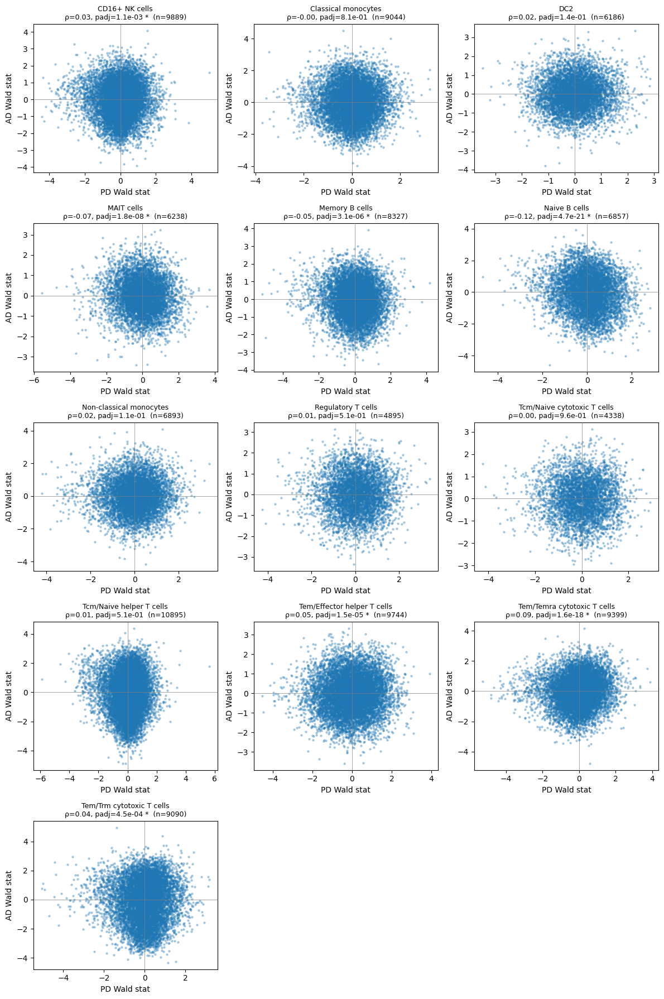

In [37]:
# n = len(scatter); ncol = 3; nrow = int(np.ceil(n / ncol))
# fig, axes = plt.subplots(nrow, ncol, figsize=(4*ncol, 3.6*nrow), squeeze=False)

# for ax, (ct, m) in zip(axes.flat, scatter.items()):
#     ax.scatter(m["stat_PD"], m["stat_AD"], s=5, alpha=0.3)
#     r = corr.loc[corr.cell_type == ct].iloc[0]
#     ax.axhline(0, color="grey", lw=0.5); ax.axvline(0, color="grey", lw=0.5)
#     star = " *" if r["sig"] else ""
#     ax.set_title(f"{ct}\nρ={r['rho']:.2f}, padj={r['padj']:.1e}{star}  (n={r['n_genes']})",
#                  fontsize=9)
#     ax.set_xlabel("PD Wald stat"); ax.set_ylabel("AD Wald stat")

# for ax in axes.flat[n:]:
#     ax.axis("off")
# plt.tight_layout(); plt.show()


In [ ]:
### PD vs AD DE correlation — restricted to genes that are a significant hit in ≥1 contrast

MIN_GENES = 10
sig_keys = set(zip(sig_global["cell_type"], sig_global["contrast"], sig_global["gene"]))

rows, scatter = [], {}
for ct in de_all["cell_type"].unique():
    pd_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "PD_vs_CTRL")]
    ad_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "AD_vs_CTRL")]

    m = (pd_res.merge(ad_res, on="gene", suffixes=("_PD", "_AD"))
               .dropna(subset=["stat_PD", "stat_AD"]))

    # significant in AT LEAST ONE contrast, per sig_global
    keep = m["gene"].map(lambda gn: (ct, "PD_vs_CTRL", gn) in sig_keys
                                 or (ct, "AD_vs_CTRL", gn) in sig_keys)
    m = m[keep]

    if len(m) < MIN_GENES:
        print(f"skip {ct}: only {len(m)} genes significant in ≥1 contrast")
        continue

    rho, p = spearmanr(m["stat_PD"], m["stat_AD"])
    rows.append({"cell_type": ct, "n_genes": len(m), "rho": rho, "pval": p})
    scatter[ct] = m

corr_sig = pd.DataFrame(rows)
if len(corr_sig):
    corr_sig["padj"] = multipletests(corr_sig["pval"], method="fdr_bh")[1]
    corr_sig["sig"]  = corr_sig["padj"] < 0.05
corr_sig.sort_values("rho", ascending=False)


In [ ]:
n = len(scatter); ncol = 3; nrow = int(np.ceil(n / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(4*ncol, 3.6*nrow), squeeze=False)

for ax, (ct, m) in zip(axes.flat, scatter.items()):
    ax.scatter(m["stat_PD"], m["stat_AD"], s=5, alpha=0.3)
    r = corr_sig.loc[corr_sig.cell_type == ct].iloc[0]
    ax.axhline(0, color="grey", lw=0.5); ax.axvline(0, color="grey", lw=0.5)
    star = " *" if r["sig"] else ""
    ax.set_title(f"{ct}\nρ={r['rho']:.2f}, padj={r['padj']:.1e}{star}  (n={r['n_genes']})",
                 fontsize=9)
    ax.set_xlabel("PD Wald stat"); ax.set_ylabel("AD Wald stat")

for ax in axes.flat[n:]:
    ax.axis("off")
plt.tight_layout(); plt.show()


In [38]:
PADJ_COL, LFC_THR, FDR_THR = "padj_global", 0.585, 0.05    

def sig_lfc(df):                                     # significant genes -> their log2FC
    s = df[(df[PADJ_COL] < FDR_THR) & (df["log2FoldChange"].abs() > LFC_THR)]
    return s.set_index("gene")["log2FoldChange"]

rows, shared_tables = [], {}
for ct in de_all["cell_type"].unique():
    pd_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "PD_vs_CTRL")]
    ad_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "AD_vs_CTRL")]

    universe = set(pd_res["gene"]) & set(ad_res["gene"])      # tested in BOTH
    if len(universe) < 20:
        continue

    pd_sig = sig_lfc(pd_res); pd_sig = pd_sig[pd_sig.index.isin(universe)]
    ad_sig = sig_lfc(ad_res); ad_sig = ad_sig[ad_sig.index.isin(universe)]
    shared = pd_sig.index.intersection(ad_sig.index)

    same_dir = int((np.sign(pd_sig[shared]) == np.sign(ad_sig[shared])).sum())

    # hypergeometric: is the overlap bigger than chance?
    M, n, N, k = len(universe), len(pd_sig), len(ad_sig), len(shared)
    p = hypergeom.sf(k - 1, M, n, N) if (n > 0 and N > 0) else np.nan

    rows.append({"cell_type": ct, "PD_sig": n, "AD_sig": N, "shared": k,
                 "same_direction": same_dir, "universe": M, "pval": p})
    if k > 0:
        shared_tables[ct] = pd.DataFrame({"log2FC_PD": pd_sig[shared],
                                          "log2FC_AD": ad_sig[shared]})

ov = pd.DataFrame(rows)
ok = ov["pval"].notna()
ov["padj"] = np.nan
ov.loc[ok, "padj"] = multipletests(ov.loc[ok, "pval"], method="fdr_bh")[1]   # across cell types
ov["sig_overlap"] = ov["padj"] < 0.05
ov.sort_values("shared", ascending=False)


,cell_type,PD_sig,AD_sig,shared,same_direction,universe,pval,padj,sig_overlap
0,CD16+ NK cells,4,0,0,0,9889,NaN,NaN,False
1,Classical monocytes,0,0,0,0,9044,NaN,NaN,False
2,DC2,0,0,0,0,6186,NaN,NaN,False
3,MAIT cells,2,0,0,0,6238,NaN,NaN,False
4,Memory B cells,8,0,0,0,8327,NaN,NaN,False
5,Naive B cells,1,1,0,0,6857,1.0,1.0,False
6,Non-classical monocytes,0,0,0,0,6893,NaN,NaN,False
7,Regulatory T cells,0,0,0,0,4895,NaN,NaN,False
8,Tcm/Naive cytotoxic T cells,0,0,0,0,4338,NaN,NaN,False
9,Tcm/Naive helper T cells,3,11,0,0,10895,1.0,1.0,False


In [ ]:
def top_degs(contrast, ct, n=10):
    d = de_all[(de_all.contrast==contrast) & (de_all.cell_type==ct)].dropna(subset=["stat"])
    d = d[(d.padj_global < FDR_THR) & (d.log2FoldChange.abs() > LFC_THR)]
    return d.reindex(d["stat"].abs().sort_values(ascending=False).index).head(n)

for contrast in ["PD_vs_CTRL", "AD_vs_CTRL"]:
    print(f"\n===== {contrast} =====")
    for ct in de_all.cell_type.unique():
        t = top_degs(contrast, ct)
        if len(t):
            print(f"\n{ct}:")
            print(t[["gene","log2FoldChange","stat","padj"]].to_string(index=False))



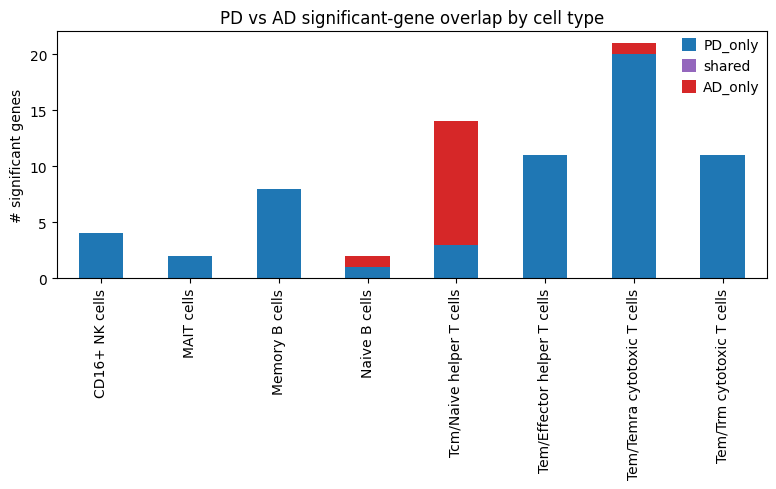

In [39]:
b = ov.copy()
b["PD_only"] = b["PD_sig"] - b["shared"]
b["AD_only"] = b["AD_sig"] - b["shared"]
b = b.set_index("cell_type")[["PD_only", "shared", "AD_only"]]
b = b[b.sum(axis=1) > 0]
ax = b.plot(kind="bar", stacked=True, figsize=(8, 5),
            color={"PD_only": "#1f77b4", "shared": "#9467bd", "AD_only": "#d62728"})
ax.set_ylabel("# significant genes"); ax.set_xlabel("")
ax.set_title("PD vs AD significant-gene overlap by cell type")
plt.tight_layout(); plt.show()

In [40]:
### Pathway analysis

# pre-ranked GSEA (per cell type x contrast) using the wald statistic as the ranking metric
sub = de_all[(de_all["cell_type"] == "Classical monocytes") &
             (de_all["contrast"]  == "PD_vs_CTRL")].copy()

# rank by signed Wald stat; drop genes DESeq2 couldn't test (NaN from Cook's/filtering)
rnk = (sub.dropna(subset=["stat"])
          .drop_duplicates("gene")
          .sort_values("stat", ascending=False)[["gene", "stat"]])

pre_res = gp.prerank(
    rnk=rnk,                                   # 2-col df: gene, score
    gene_sets=["KEGG_2021_Human"],
    min_size=15, max_size=500,                 # ignore tiny/huge gene sets
    permutation_num=1000,
    seed=0,
    outdir=None,
)
pre_res.res2d.sort_values("NES").head()        # NES, FDR q-val, leading-edge genes


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,KEGG_2021_Human__Base excision repair,-0.513186,-1.718642,0.010163,0.492927,0.334,13/29,15.68%,NTHL1;XRCC1;LIG3;POLB;OGG1;APEX1;SMUG1;POLD2;T...
4,prerank,KEGG_2021_Human__Ribosome,-0.371056,-1.637638,0.001953,0.511275,0.554,63/127,32.23%,MRPL32;MRPL23;MRPL35;RPL9;RPS16;RPL37A;MRPL30;...
6,prerank,KEGG_2021_Human__Glycerophospholipid metabolism,-0.404841,-1.599612,0.002062,0.479041,0.661,21/65,16.03%,CRLS1;PNPLA6;CHKB;PTDSS1;AGPAT1;PLA2G12A;ADPRM...
7,prerank,KEGG_2021_Human__Glyoxylate and dicarboxylate ...,-0.503539,-1.574407,0.026477,0.451271,0.745,10/24,17.08%,PGP;HYI;ACSS2;MCEE;GLYCTK;SHMT1;AFMID;SHMT2;GR...
8,prerank,KEGG_2021_Human__Cushing syndrome,-0.386664,-1.566093,0.007463,0.382836,0.764,22/75,19.19%,ORAI1;DVL1;MAP2K2;GNAS;CDKN2C;NCEH1;FZD1;DVL2;...


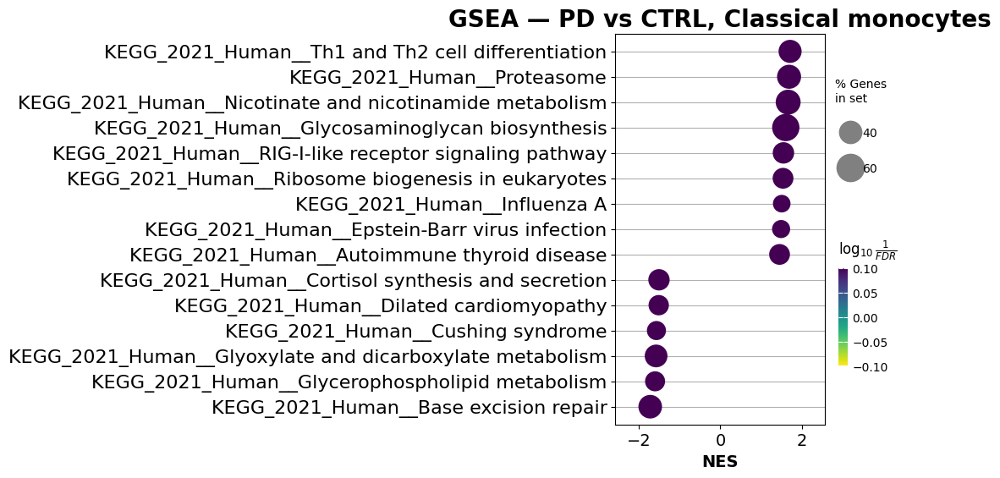

In [41]:
ax = dotplot(pre_res.res2d,
             column="FDR q-val",         # colour by FDR
             title="GSEA — PD vs CTRL, Classical monocytes",
             cmap="viridis_r",
             size=5,
             top_term=15,                # show top 15 terms
             figsize=(4, 6),
             cutoff=1)                    # <-- so something is still plotted even when no significant terms, else dotplot fails


[<Axes: xlabel='Gene Rank', ylabel='Ranked metric'>,
 <Axes: >,
 <Axes: >,
 <Axes: ylabel='Enrichment Score'>]

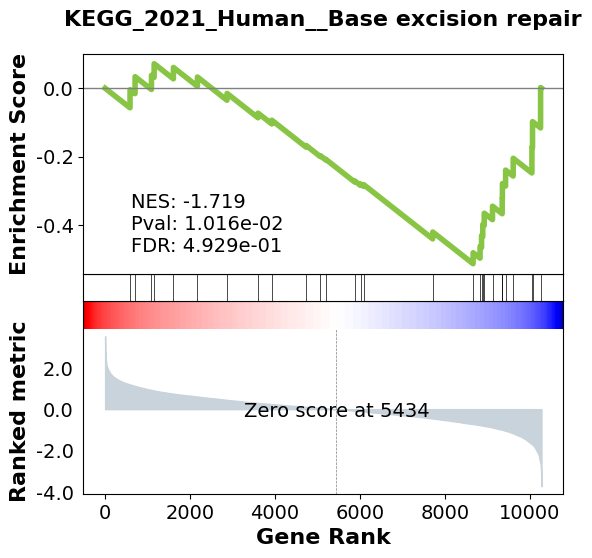

In [42]:
term = pre_res.res2d.sort_values("NES")["Term"].iloc[0]   # e.g. most negative NES
gseaplot(rank_metric=pre_res.ranking,
         term=term,
         **pre_res.results[term],         # unpacks ES, hits, RES, etc.
         ofname=None)


In [43]:
# Pathway analysis loop for all cell types x contrasts

# LIBRARIES = {
#     "GO_BP":        "GO_Biological_Process_2021",
#     "Reactome":     "Reactome_2022",
#     "KEGG":         "KEGG_2021_Human",
#     "WikiPathways": "WikiPathways_2024_Human",
# }
GENE_SETS    = "GO_Biological_Process_2026"   # one primary library (for compatibility with semantic similarity reduction)
GENE_SET_LABEL = "GO_BP"
FDR_TERM_THR = 0.05
MIN_RANKED   = 15                             # need enough ranked genes to bother

prerank_all  = []     # collect res2d tables across all cell types/contrasts
prerank_objs = {}     # keep full result objects, keyed by (cell_type, contrast), for plotting

pairs = de_all[["cell_type", "contrast"]].drop_duplicates().itertuples(index=False)

for cell_type, contrast in pairs:
    sub = de_all[(de_all["cell_type"] == cell_type) & (de_all["contrast"] == contrast)]

    # ranking: unique genes, drop genes DESeq2 couldn't test, sort high -> low by Wald stat
    rnk = (sub.dropna(subset=["stat"])
              .drop_duplicates("gene")
              .sort_values("stat", ascending=False)[["gene", "stat"]])

    if rnk.shape[0] < MIN_RANKED:
        print(f"skip {cell_type} | {contrast}: only {rnk.shape[0]} ranked genes")
        continue

    try:
        pre = gp.prerank(rnk=rnk, gene_sets=GENE_SETS,
                        min_size=15, max_size=500,
                        permutation_num=1000, seed=0,
                        threads=4, outdir=None, no_plot=True)
    except Exception as e:
        print(f"prerank failed for {cell_type} | {contrast}: {e}")
        continue


    res = pre.res2d.copy()
    res["cell_type"] = cell_type
    res["contrast"]  = contrast
    res["library"] = GENE_SET_LABEL
    res["FDR q-val"] = pd.to_numeric(res["FDR q-val"], errors="coerce")
    res["NES"]       = pd.to_numeric(res["NES"], errors="coerce")
    res["sig"] = res["FDR q-val"] < FDR_TERM_THR     # <-- significance flag kept here
    prerank_all.append(res)
    prerank_objs[(cell_type, contrast, GENE_SET_LABEL)] = pre

    print(f"{cell_type} | {contrast}: {res['sig'].sum()} terms at "
        f"FDR<{FDR_TERM_THR} (of {len(res)} tested)")

gsea_all = pd.concat(prerank_all, ignore_index=True)

# all genuinely significant pathways across everything:
gsea_all[gsea_all["sig"]].sort_values(["cell_type", "contrast", "FDR q-val"])

g = gsea_all.copy() # used downstream

CD16+ NK cells | PD_vs_CTRL: 10 terms at FDR<0.05 (of 1820 tested)
CD16+ NK cells | AD_vs_CTRL: 39 terms at FDR<0.05 (of 1733 tested)
Classical monocytes | PD_vs_CTRL: 5 terms at FDR<0.05 (of 1834 tested)
Classical monocytes | AD_vs_CTRL: 55 terms at FDR<0.05 (of 1698 tested)
DC2 | PD_vs_CTRL: 18 terms at FDR<0.05 (of 1457 tested)
DC2 | AD_vs_CTRL: 22 terms at FDR<0.05 (of 1283 tested)
MAIT cells | PD_vs_CTRL: 0 terms at FDR<0.05 (of 1323 tested)
MAIT cells | AD_vs_CTRL: 9 terms at FDR<0.05 (of 1218 tested)
Memory B cells | PD_vs_CTRL: 9 terms at FDR<0.05 (of 1585 tested)
Memory B cells | AD_vs_CTRL: 20 terms at FDR<0.05 (of 1520 tested)
NK cells | AD_vs_CTRL: 8 terms at FDR<0.05 (of 933 tested)
Naive B cells | PD_vs_CTRL: 10 terms at FDR<0.05 (of 1468 tested)
Naive B cells | AD_vs_CTRL: 54 terms at FDR<0.05 (of 1266 tested)
Non-classical monocytes | PD_vs_CTRL: 0 terms at FDR<0.05 (of 1630 tested)
Non-classical monocytes | AD_vs_CTRL: 31 terms at FDR<0.05 (of 1374 tested)
Regulatory T

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,cell_type,contrast,library,significant
1820,prerank,Cytoplasmic Translation (GO:0002181),0.652404,3.189029,0.000000,0.000000,0.000,78/103,20.87%,DRG1;RPS28;RWDD1;RPS27;RPL35A;RPL34;RPS21;RPL3...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
1821,prerank,Protein Biosynthetic Process (GO:0160307),0.591096,3.010299,0.000000,0.000000,0.000,93/135,26.54%,RPS28;RPS27;TNIP1;RPL35A;RPL34;RPS21;RPL37A;FA...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
1822,prerank,Translation (GO:0006412),0.540550,2.946122,0.000000,0.000000,0.000,139/227,26.21%,DRG1;RPS28;RWDD1;GATC;MRPL48;RPS27;TNIP1;RPL35...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
1823,prerank,Negative Regulation of Myoblast Fusion (GO:190...,0.715271,2.924842,0.000000,0.000000,0.000,43/46,26.21%,RPL35A;RPL34;RPL37A;RPL37;TMEM182;RPL36;RPL39;...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
1824,prerank,Negative Regulation of Syncytium Formation by ...,0.715271,2.924842,0.000000,0.000000,0.000,43/46,26.21%,RPL35A;RPL34;RPL37A;RPL37;TMEM182;RPL36;RPL39;...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38619,prerank,Regulation of Release of Cytochrome C From Mit...,0.479582,1.890861,0.000000,0.041170,0.675,17/29,25.94%,AKT1;BBC3;MOAP1;TRIAP1;PLSCR3;CLU;GZMK;BAX;PRE...,Tem/Trm cytotoxic T cells,AD_vs_CTRL,GO_BP,True
38620,prerank,Positive Regulation of Response to Endoplasmic...,0.493380,1.886817,0.002740,0.041470,0.685,13/26,19.00%,BBC3;BAG6;UBQLN2;SHISA5;HERPUD1;STUB1;BCAP31;D...,Tem/Trm cytotoxic T cells,AD_vs_CTRL,GO_BP,True
38623,prerank,T Cell Homeostasis (GO:0043029),0.505880,1.877680,0.002703,0.042982,0.705,16/27,27.43%,AKT1;TNFSF14;PPP2CA;SIVA1;PSMA4;PSMB8;PSMA7;PM...,Tem/Trm cytotoxic T cells,AD_vs_CTRL,GO_BP,True
38604,prerank,Neuron Projection Guidance (GO:0097485),-0.528629,-1.969976,0.000000,0.044155,0.327,17/36,18.89%,PRKCQ;PTPRJ;FYN;TENM1;SOS1;MYCBP2;ARHGAP35;FEZ...,Tem/Trm cytotoxic T cells,AD_vs_CTRL,GO_BP,True


In [ ]:
# Save GSEA results to CSV

front = ["cell_type", "contrast", "library", "Term", "NES", "FDR q-val"]
gsea_out = g.sort_values("FDR q-val")[front + [c for c in g.columns if c not in front]]
gsea_out.to_csv("gsea_results.csv", index=False)
print(f"saved {len(gsea_out)} rows -> gsea_results.csv")

In [ ]:
# check how many for PD vs AD

g.groupby("contrast")["sig"].sum()

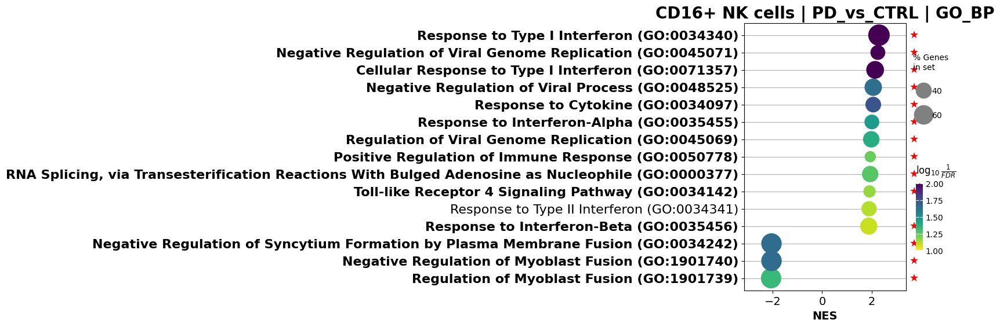

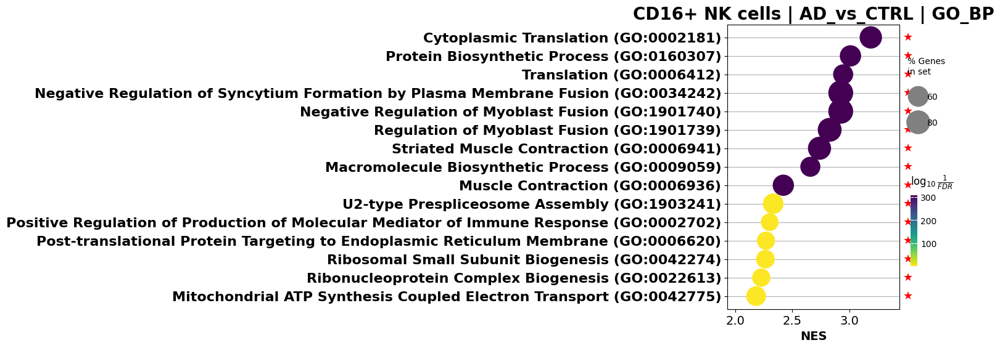

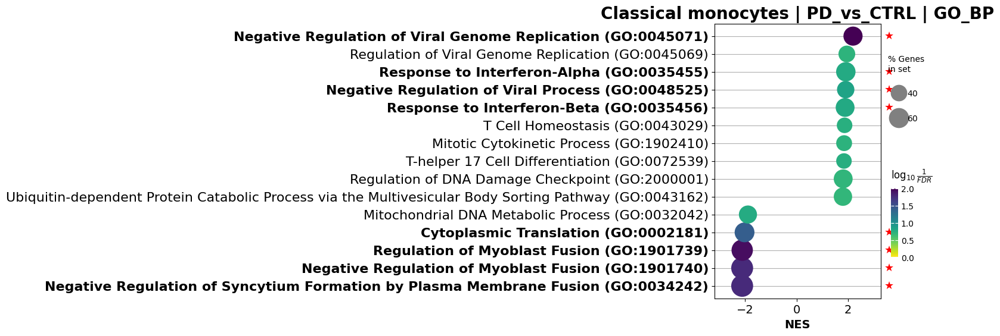

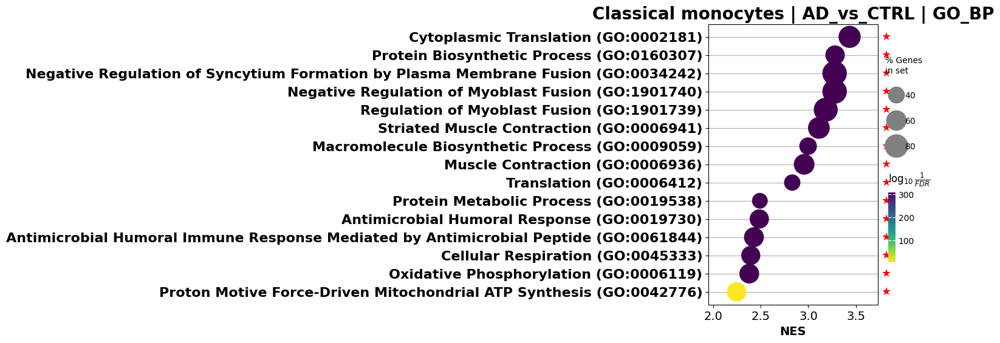

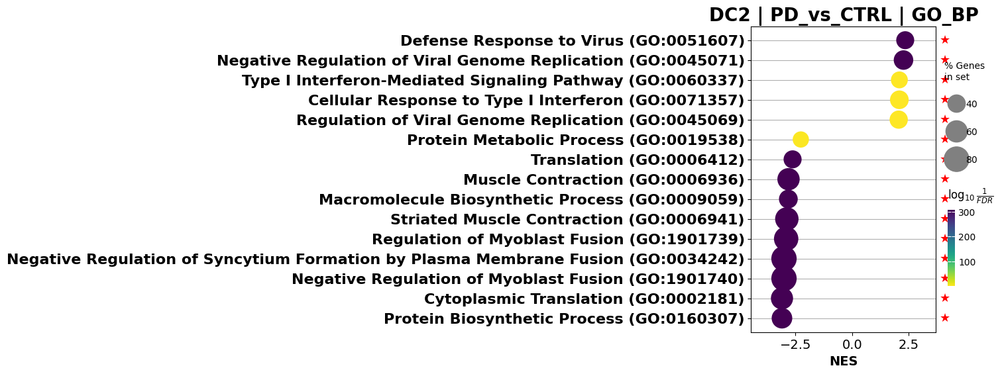

...

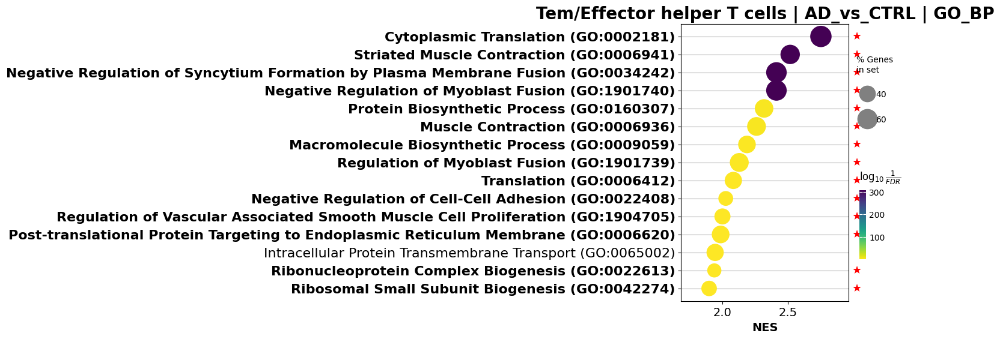

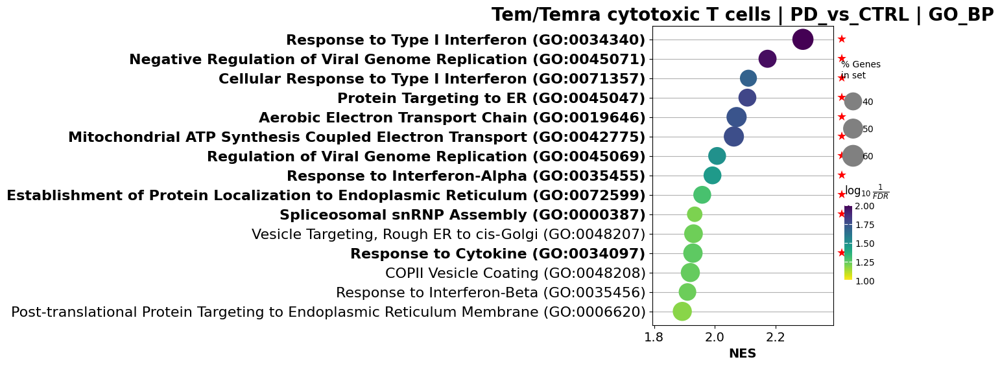

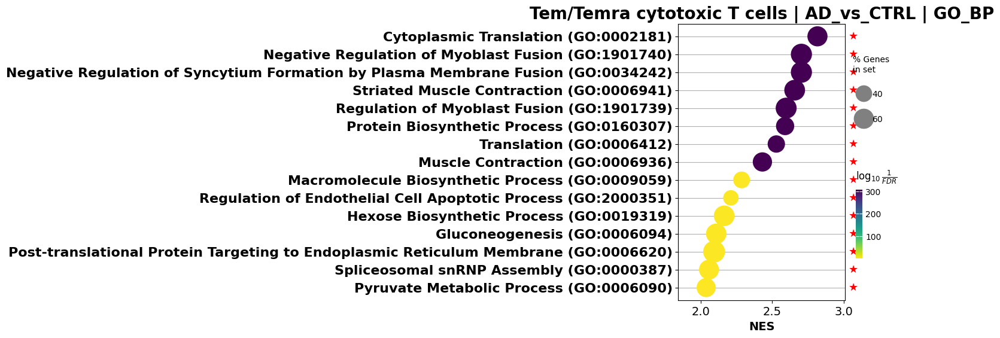

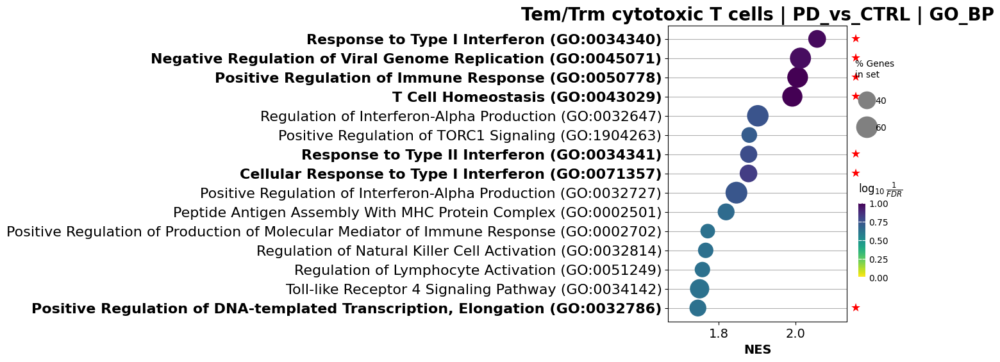

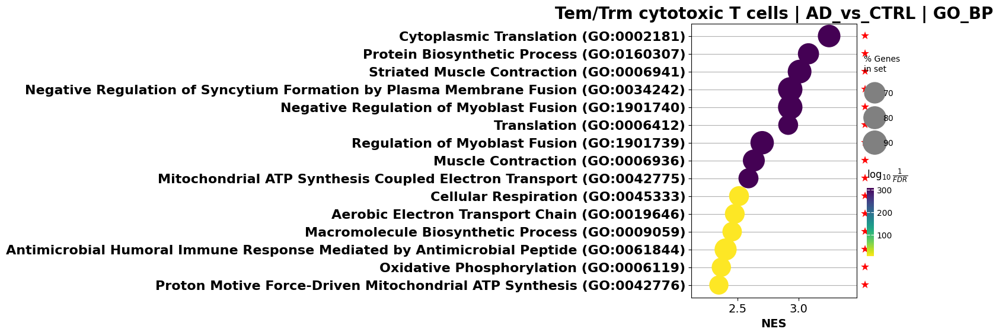

In [45]:
for (ct, contrast, lib), pre in prerank_objs.items():
    df = pre.res2d.copy()
    df["FDR q-val"] = pd.to_numeric(df["FDR q-val"], errors="coerce")
    
    # terms significant under your corrected FDR (from the pooled table g)
    sig_terms = set(
        g[(g["cell_type"] == ct) & (g["contrast"] == contrast) &
        (g["library"] == lib) & g["sig"]]["Term"]
    )

    ax = dotplot(df, column="FDR q-val", top_term=15, cutoff=1,
                title=f"{ct} | {contrast} | {lib}", figsize=(4.5, 6), cmap="viridis_r")

    # star each significant row, just right of the plot
    for ytick, lbl in zip(ax.get_yticks(), ax.get_yticklabels()):
        if lbl.get_text() in sig_terms:
            ax.annotate("★", xy=(1.02, ytick),
                        xycoords=("axes fraction", "data"),
                        ha="left", va="center", fontsize=13, color="red",
                        annotation_clip=False)
            lbl.set_fontweight("bold")        # also bold the label
    plt.show()

In [ ]:
# GSEA correlation between PD and AD (terms significant in at least one contrast)

MIN_TERMS = 10

rows_g, scatter_g = [], {}
for ct in g["cell_type"].unique():
    pd_g = g[(g.cell_type == ct) & (g.contrast == "PD_vs_CTRL")]
    ad_g = g[(g.cell_type == ct) & (g.contrast == "AD_vs_CTRL")]

    m = (pd_g.merge(ad_g, on="Term", suffixes=("_PD", "_AD"))
             .dropna(subset=["NES_PD", "NES_AD"]))

    m = m[m["sig_PD"] | m["sig_AD"]]                 # significant in at least one
    if len(m) < MIN_TERMS:
        print(f"skip {ct}: only {len(m)} terms significant in ≥1 group")
        continue

    rho, p = spearmanr(m["NES_PD"], m["NES_AD"])
    rows_g.append({"cell_type": ct, "n_terms": len(m), "rho": rho, "pval": p})
    scatter_g[ct] = m

corr_gsea = pd.DataFrame(rows_g)
if len(corr_gsea):
    corr_gsea["padj"] = multipletests(corr_gsea["pval"], method="fdr_bh")[1]
    corr_gsea["sig"]  = corr_gsea["padj"] < 0.05
corr_gsea.sort_values("rho", ascending=False)


In [ ]:
n = len(scatter_g); ncol = 3; nrow = int(np.ceil(n / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(4*ncol, 3.6*nrow), squeeze=False)
for ax, (ct, m) in zip(axes.flat, scatter_g.items()):
    ax.scatter(m["NES_PD"], m["NES_AD"], s=8, alpha=0.5)
    r = corr_gsea.loc[corr_gsea.cell_type == ct].iloc[0]
    ax.axhline(0, color="grey", lw=0.5); ax.axvline(0, color="grey", lw=0.5)
    star = " *" if r["sig"] else ""
    ax.set_title(f"{ct}\nρ={r['rho']:.2f}, padj={r['padj']:.1e}{star} (n={r['n_terms']})", fontsize=9)
    ax.set_xlabel("PD NES"); ax.set_ylabel("AD NES")
for ax in axes.flat[n:]:
    ax.axis("off")
plt.tight_layout(); plt.show()


In [46]:
# sig = g[g["sig"]].copy()

# for contrast, d in sig.groupby("contrast"):
#     mat = d.pivot_table(index="cell_type", columns="library",
#                         values="Term", aggfunc="count", fill_value=0)
#     plt.figure(figsize=(6, 4))
#     sns.heatmap(mat, annot=True, fmt="d", cmap="Blues")
#     plt.title(f"# significant pathways — {contrast}")
#     plt.tight_layout(); plt.show()


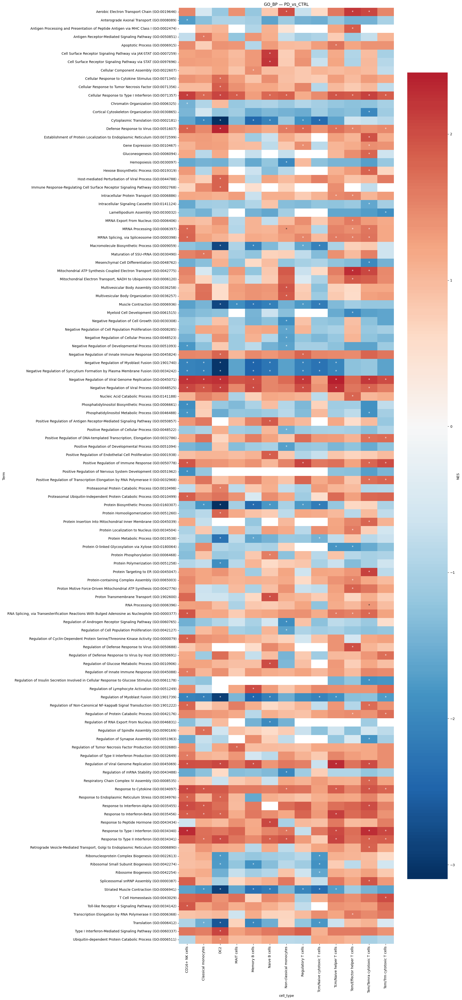

In [47]:
lib, contrast = "GO_BP", "PD_vs_CTRL"
d = g[(g["library"] == lib) & (g["contrast"] == contrast)].copy()

terms = d.loc[d["sig"], "Term"].unique()                 # sig in ≥1 cell type
nes = d[d["Term"].isin(terms)].pivot_table(index="Term", columns="cell_type", values="NES")
sigmask = d[d["Term"].isin(terms)].pivot_table(index="Term", columns="cell_type",
                                               values="sig", aggfunc="any").fillna(False)

plt.figure(figsize=(1.2*nes.shape[1]+3, 0.35*len(terms)+2))
sns.heatmap(nes, cmap="RdBu_r", center=0,
            annot=sigmask.replace({True: "*", False: ""}), fmt="",
            cbar_kws={"label": "NES"})
plt.title(f"{lib} — {contrast}")
plt.tight_layout(); plt.show()

In [ ]:
import os
import numpy as np

# ---- Build at FINAL printed size. Numbers below are true points on the page. ----
PAGE_W, PAGE_H = 6.5, 9.3
FS_TICK_Y, FS_TICK_X, FS_LABEL, FS_TITLE, FS_ANNOT = 8, 8, 9, 10, 7
MAX_TERMS = None
MAX_LABEL_CHARS = 45             # long GO names otherwise steal the plot width
STAR_Y_OFFSET = 0.12             # nudge down; y-axis is inverted in seaborn heatmaps
CMAP = "RdYlBu_r"                # ColorBrewer; red = up, blue = down

FIG_DIR = "/rds/general/user/ztb25/home/figures"
os.makedirs(FIG_DIR, exist_ok=True)

HIGHLIGHT_KEYWORDS = [
    "nlrp3", "inflammasome", "pyroptos",
    "type ii interferon", "interferon-gamma",
    "antimicrobial", "lipopolysaccharide",
]

# One colour scale across both contrasts, restricted to terms that actually
# reach a figure — including non-significant terms would widen the scale and
# wash out the colours in both panels.
both = g[(g["library"] == "GO_BP") & g["contrast"].isin(["PD_vs_CTRL", "AD_vs_CTRL"])]
plotted_terms = both.loc[both["sig"], "Term"].unique()
VMAX_SHARED = float(np.nanmax(np.abs(both.loc[both["Term"].isin(plotted_terms), "NES"])))
print(f"shared NES scale: ±{VMAX_SHARED:.2f}")

# ---------------------------------------------------------------- build matrix
lib, contrast = "GO_BP", "PD_vs_CTRL"
d = g[(g["library"] == lib) & (g["contrast"] == contrast)].copy()
d["term_label"] = d["Term"].str.replace(r"\s*\(GO:\d+\)\s*$", "", regex=True).str.strip()

terms = d.loc[d["sig"], "term_label"].unique()
sub = d[d["term_label"].isin(terms)]

nes = sub.pivot_table(index="term_label", columns="cell_type", values="NES")
sigmask = (sub.pivot_table(index="term_label", columns="cell_type",
                           values="sig", aggfunc="any")
              .reindex(index=nes.index, columns=nes.columns)
              .fillna(False))

row_order = nes.abs().max(axis=1).sort_values(ascending=False).index[:MAX_TERMS]
nes, sigmask = nes.loc[row_order], sigmask.loc[row_order]
print(f"showing {len(nes)} of {len(terms)} significant terms")

nes.index = [t if len(t) <= MAX_LABEL_CHARS else t[:MAX_LABEL_CHARS - 1] + "…"
             for t in nes.index]
sigmask.index = nes.index        # keep the two aligned after truncating

# ---------------------------------------------------------------------- plot
if nes.empty:
    print(f"no significant {lib} terms for {contrast} — skipping heatmap")
else:
    fig = plt.figure(figsize=(PAGE_W, PAGE_H))
    # explicit [left, bottom, width, height] in figure fractions — this is what
    # stops the label column expanding into the heatmap
    ax  = fig.add_axes([0.34, 0.14, 0.60, 0.82])
    cax = fig.add_axes([0.955, 0.40, 0.010, 0.22])   # thin, short colourbar

    sns.heatmap(
        nes, cmap=CMAP, vmin=-VMAX_SHARED, vmax=VMAX_SHARED, center=0,
        linewidths=0.3, linecolor="white",
        yticklabels=True,
        xticklabels=True,
        ax=ax, cbar_ax=cax,
    )
    ax.set_facecolor("#b8b7b0")   # NaN = pathway not tested in that cell type

    for i, term in enumerate(nes.index):
        for j, cell_type in enumerate(nes.columns):
            value = nes.loc[term, cell_type]
            if bool(sigmask.loc[term, cell_type]) and not np.isnan(value):
                ax.text(j + 0.5, i + 0.5 + STAR_Y_OFFSET, "*",
                        ha="center", va="center_baseline",
                        fontsize=FS_ANNOT, fontweight="bold",
                        color="white" if abs(value) / VMAX_SHARED > 0.65 else "#0b0b0b")

    for tick_label in ax.get_yticklabels():
        if any(kw in tick_label.get_text().lower() for kw in HIGHLIGHT_KEYWORDS):
            tick_label.set_fontweight("bold")
            tick_label.set_color("#0b0b0b")
        else:
            tick_label.set_color("#3d3d3a")

    ax.set_xlabel(""); ax.set_ylabel("")
    ax.tick_params(axis="y", labelsize=FS_TICK_Y, length=0, pad=2)
    ax.tick_params(axis="x", labelsize=FS_TICK_X, rotation=35, length=0)
    for tick_label in ax.get_xticklabels():
        tick_label.set_ha("right")

    ax.set_title(f"{lib} — {contrast.replace('_', ' ')}", fontsize=FS_TITLE, pad=8)

    cax.tick_params(labelsize=FS_TICK_X)
    cax.set_ylabel("NES", size=FS_LABEL, rotation=90, labelpad=6)

    # NO tight_layout — it overrides add_axes and undoes the layout above
    fig.savefig(f"{FIG_DIR}/gsea_heatmap_{lib}_{contrast}.pdf", bbox_inches="tight")
    plt.show()


In [ ]:

# # ---------------------------------------------------------------- build matrix
# lib, contrast = "GO_BP", "AD_vs_CTRL"
# d = g[(g["library"] == lib) & (g["contrast"] == contrast)].copy()
# d["term_label"] = d["Term"].str.replace(r"\s*\(GO:\d+\)\s*$", "", regex=True).str.strip()

# terms = d.loc[d["sig"], "term_label"].unique()
# sub = d[d["term_label"].isin(terms)]

# nes = sub.pivot_table(index="term_label", columns="cell_type", values="NES")
# sigmask = (sub.pivot_table(index="term_label", columns="cell_type",
#                            values="sig", aggfunc="any")
#               .reindex(index=nes.index, columns=nes.columns)
#               .fillna(False))

# row_order = nes.abs().max(axis=1).sort_values(ascending=False).index[:MAX_TERMS]
# nes, sigmask = nes.loc[row_order], sigmask.loc[row_order]
# print(f"showing {len(nes)} of {len(terms)} significant terms")

# nes.index = [t if len(t) <= MAX_LABEL_CHARS else t[:MAX_LABEL_CHARS - 1] + "…"
#              for t in nes.index]
# sigmask.index = nes.index        # keep the two aligned after truncating

# # ---------------------------------------------------------------------- plot
# if nes.empty:
#     print(f"no significant {lib} terms for {contrast} — skipping heatmap")
# else:
#     fig = plt.figure(figsize=(PAGE_W, PAGE_H))
#     # explicit [left, bottom, width, height] in figure fractions — this is what
#     # stops the label column expanding into the heatmap
#     ax  = fig.add_axes([0.34, 0.14, 0.60, 0.82])
#     cax = fig.add_axes([0.955, 0.40, 0.010, 0.22])   # thin, short colourbar

#     sns.heatmap(
#         nes, cmap=CMAP, vmin=-VMAX_SHARED, vmax=VMAX_SHARED, center=0,
#         linewidths=0.3, linecolor="white",
#         ax=ax, cbar_ax=cax,
#     )
#     ax.set_facecolor("#b8b7b0")   # NaN = pathway not tested in that cell type

#     for i, term in enumerate(nes.index):
#         for j, cell_type in enumerate(nes.columns):
#             value = nes.loc[term, cell_type]
#             if bool(sigmask.loc[term, cell_type]) and not np.isnan(value):
#                 ax.text(j + 0.5, i + 0.5 + STAR_Y_OFFSET, "*",
#                         ha="center", va="center_baseline",
#                         fontsize=FS_ANNOT, fontweight="bold",
#                         color="white" if abs(value) / VMAX_SHARED > 0.65 else "#0b0b0b")

#     for tick_label in ax.get_yticklabels():
#         if any(kw in tick_label.get_text().lower() for kw in HIGHLIGHT_KEYWORDS):
#             tick_label.set_fontweight("bold")
#             tick_label.set_color("#0b0b0b")
#         else:
#             tick_label.set_color("#3d3d3a")

#     ax.set_xlabel(""); ax.set_ylabel("")
#     ax.tick_params(axis="y", labelsize=FS_TICK_Y, length=0, pad=2)
#     ax.tick_params(axis="x", labelsize=FS_TICK_X, rotation=35, length=0)
#     for tick_label in ax.get_xticklabels():
#         tick_label.set_ha("right")

#     ax.set_title(f"{lib} — {contrast.replace('_', ' ')}", fontsize=FS_TITLE, pad=8)

#     cax.tick_params(labelsize=FS_TICK_X)
#     cax.set_ylabel("NES", size=FS_LABEL, rotation=90, labelpad=6)

#     # NO tight_layout — it overrides add_axes and undoes the layout above
#     fig.savefig(f"{FIG_DIR}/gsea_heatmap_{lib}_{contrast}.pdf", bbox_inches="tight")
#     plt.show()


In [54]:

os.environ["R_HOME"] = "/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/R"  # from your `R RHOME`

import rpy2.robjects as ro     # now finds R via R_HOME instead of PATH
print(ro.r("R.version.string")[0])



R version 4.5.3 (2026-03-11)


In [55]:

ro.r('''
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager", repos = "https://cloud.r-project.org")
BiocManager::install(c("org.Hs.eg.db", "GO.db"), update = FALSE, ask = FALSE)
''')

R callback write-console: Bioconductor version 3.22 (BiocManager 1.30.27), R 4.5.3 (2026-03-11)
  
R callback write-console: In addition:   
R callback write-console: Warning message:
  
R callback write-console: package(s) not installed when version(s) same as or greater than current; use
  `force = TRUE` to re-install: 'org.Hs.eg.db' 'GO.db' 
  


In [59]:
# Semantic similarity reduction of GO terms (RRVGO) — PD first

rrvgo = importr("rrvgo")

# one score per unique significant GO id 
sig = g[g["sig"] & (g["contrast"] == "PD_vs_CTRL")].copy()   # PD only
sig["go_id"] = sig["Term"].str.extract(r"(GO:\d+)")
sig = sig.dropna(subset=["go_id"])

term_scores = (sig.groupby("go_id")["FDR q-val"].min()
                  .clip(lower=1/1000)  # avoid -log10(0)
                  .pipe(lambda s: -np.log10(s)))          # rrvgo picks highest-score term as parent
go_ids = term_scores.index.tolist()
print(f"{len(go_ids)} unique significant GO_BP terms into rrvgo")

333 unique significant GO_BP terms into rrvgo


In [60]:
simMatrix = rrvgo.calculateSimMatrix(
    StrVector(go_ids),
    orgdb="org.Hs.eg.db",
    ont="BP",
    method="Rel",           # REVIGO's method; alts: "Resnik","Lin","Jiang","Wang"
)

scores = FloatVector(term_scores.values)
scores.names = StrVector(term_scores.index.tolist())      # named vector, as rrvgo expects

reducedTerms = rrvgo.reduceSimMatrix(
    simMatrix, scores,
    threshold=0.7,          # 0.5 small / 0.7 medium / 0.9 large groupings
    orgdb="org.Hs.eg.db",
)


R callback write-console: 
  
R callback write-console: preparing gene to GO mapping data...
  
R callback write-console: preparing IC data...
  
R callback write-console: 'select()' returned 1:many mapping between keys and columns
  


In [61]:
# convert rrvgo result from R to pandas DataFrame for easier viewing

with (ro.default_converter + pandas2ri.converter).context():
    reduced_df = ro.conversion.get_conversion().rpy2py(reducedTerms)

# key columns: 'go', 'term', 'parent', 'parentTerm', 'cluster', 'score'
reduced_df[["term", "parentTerm", "cluster", "score"]].sort_values("cluster").head(20)


,term,parentTerm,cluster,score
GO:0006468,protein phosphorylation,peptidyl-tyrosine phosphorylation,1,1.258199
GO:0046777,protein autophosphorylation,peptidyl-tyrosine phosphorylation,1,1.062698
GO:0016310,phosphorylation,peptidyl-tyrosine phosphorylation,1,1.074334
GO:0018108,peptidyl-tyrosine phosphorylation,peptidyl-tyrosine phosphorylation,1,1.389669
GO:0000079,regulation of cyclin-dependent protein serine/...,peptidyl-tyrosine phosphorylation,1,0.973774
GO:1902806,regulation of cell cycle G1/S phase transition,G1/S transition of mitotic cell cycle,2,0.798379
GO:0000082,G1/S transition of mitotic cell cycle,G1/S transition of mitotic cell cycle,2,1.773766
GO:0140014,mitotic nuclear division,G1/S transition of mitotic cell cycle,2,0.879125
GO:0036211,protein modification process,protein K48-linked ubiquitination,3,0.925220
GO:0070936,protein K48-linked ubiquitination,protein K48-linked ubiquitination,3,1.249872


In [63]:
importr("rrvgo")

# hand the R objects + an absolute output dir to R's global environment
ro.globalenv["simMatrix"]    = simMatrix
ro.globalenv["reducedTerms"] = reducedTerms
ro.globalenv["outdir"]       = os.getcwd()      # guarantees R writes where Python looks

ro.r('''
# scatter + wordcloud/treemap/heatmap, all rendered inside R
png(file.path(outdir, "rrvgo_scatter.png"), width=1100, height=850, res=130)
print(scatterPlot(simMatrix, reducedTerms))          # print() is essential: it's a ggplot
dev.off()

png(file.path(outdir, "rrvgo_treemap.png"), width=1100, height=850, res=130)
treemapPlot(reducedTerms)                            # base grid -> draws directly
dev.off()

png(file.path(outdir, "rrvgo_heatmap.png"), width=1100, height=850, res=130)
heatmapPlot(simMatrix, reducedTerms, annotateParent=TRUE,
            annotationLabel="parentTerm", fontsize=6)
dev.off()

png(file.path(outdir, "rrvgo_wordcloud.png"), width=1100, height=850, res=130)
wordcloudPlot(reducedTerms, min.freq=1, colors="black")   # dotted arg is native R here
dev.off()
''')


R callback write-console: In addition:   
R callback write-console: Warning messages:
  
R callback write-console: 1:   
R callback write-console: In (function (x, orgdb, keytype = "ENTREZID", semdata = GOSemSim::godata(annoDb = orgdb,  :  
R callback write-console: 
   
R callback write-console:  Removed 4 terms without IC information in orgdb for BP
  
R callback write-console: 2: `aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the rrvgo package.
  Please report the issue to the authors.
This warning is displayed once per session.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 
  


1


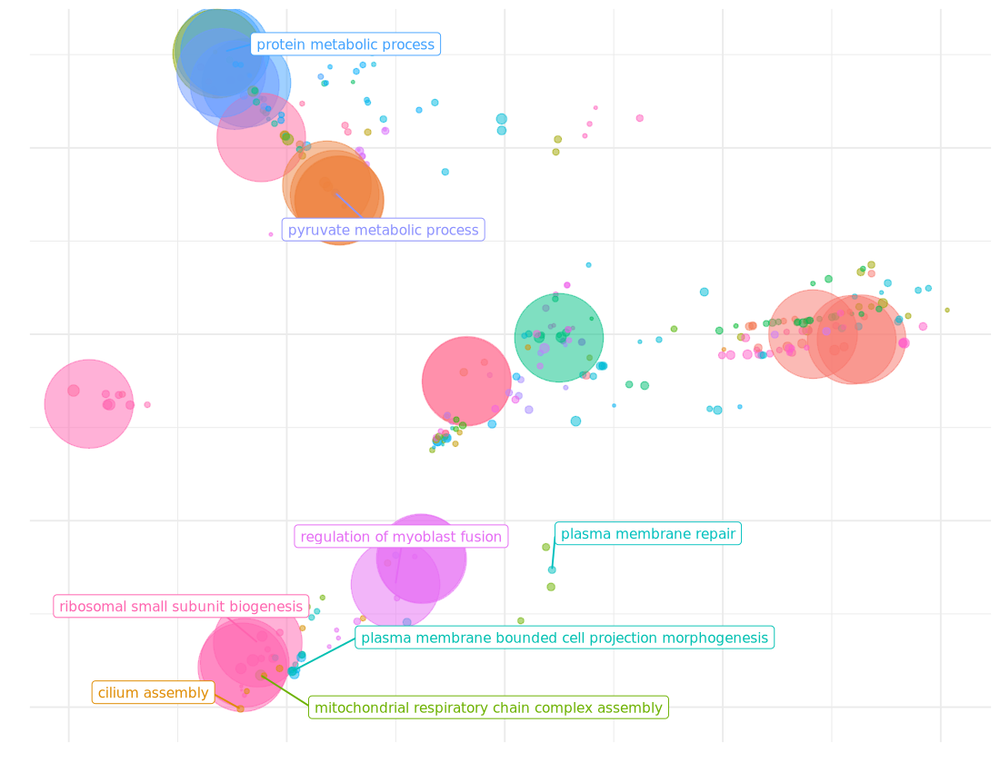

In [64]:
Image(os.path.join(os.getcwd(), "rrvgo_scatter.png"))


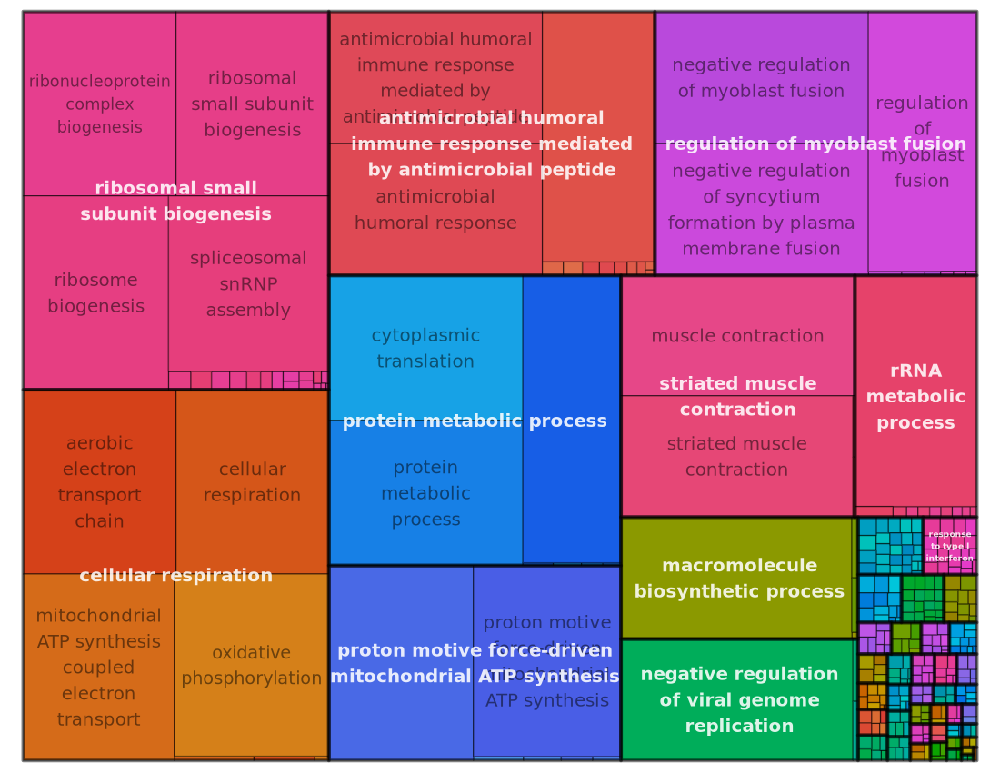

In [65]:
Image(os.path.join(os.getcwd(), "rrvgo_treemap.png"))


In [ ]:
# semantic similarity reduction for AD vs CTRL

sig_ad = g[g["sig"] & (g["contrast"] == "AD_vs_CTRL")].copy()   # AD only
sig_ad["go_id"] = sig_ad["Term"].str.extract(r"(GO:\d+)")
sig_ad = sig_ad.dropna(subset=["go_id"])

term_scores_ad = (sig_ad.groupby("go_id")["FDR q-val"].min()
                        .clip(lower=1/1000)
                        .pipe(lambda s: -np.log10(s)))
go_ids_ad = term_scores_ad.index.tolist()
print(f"{len(go_ids_ad)} unique significant GO_BP terms into rrvgo (AD)")



In [ ]:
simMatrix_ad = rrvgo.calculateSimMatrix(
    StrVector(go_ids_ad), orgdb="org.Hs.eg.db", ont="BP", method="Rel")

scores_ad = FloatVector(term_scores_ad.values)
scores_ad.names = StrVector(term_scores_ad.index.tolist())

reducedTerms_ad = rrvgo.reduceSimMatrix(
    simMatrix_ad, scores_ad, threshold=0.7, orgdb="org.Hs.eg.db")


In [ ]:
with (ro.default_converter + pandas2ri.converter).context():
    reduced_df_ad = ro.conversion.get_conversion().rpy2py(reducedTerms_ad)

# key columns: 'go', 'term', 'parent', 'parentTerm', 'cluster', 'score'
reduced_df_ad[["term", "parentTerm", "cluster", "score"]].sort_values("cluster").head(20)


In [ ]:
ro.globalenv["simMatrix"]    = simMatrix_ad
ro.globalenv["reducedTerms"] = reducedTerms_ad
ro.globalenv["outdir"]       = os.getcwd()

ro.r('''
png(file.path(outdir, "rrvgo_scatter_AD.png"), width=1100, height=850, res=130)
print(scatterPlot(simMatrix, reducedTerms)); dev.off()

png(file.path(outdir, "rrvgo_treemap_AD.png"), width=1100, height=850, res=130)
treemapPlot(reducedTerms); dev.off()

png(file.path(outdir, "rrvgo_heatmap_AD.png"), width=1100, height=850, res=130)
heatmapPlot(simMatrix, reducedTerms, annotateParent=TRUE,
            annotationLabel="parentTerm", fontsize=6); dev.off()

png(file.path(outdir, "rrvgo_wordcloud_AD.png"), width=1100, height=850, res=130)
wordcloudPlot(reducedTerms, min.freq=1, colors="black"); dev.off()
''')


In [ ]:
Image(os.path.join(os.getcwd(), "rrvgo_scatter_AD.png"))


In [ ]:
Image(os.path.join(os.getcwd(), "rrvgo_treemap_AD.png"))  
